# Assignment 2 - The Million Song Dataset (MSD)

- https://spark.apache.org/docs/latest/ml-guide.html 
- https://spark.apache.org/docs/latest/api/python/reference/pyspark.ml.html

In [1017]:
# Run this cell to import pyspark and to define start_spark() and stop_spark()

import findspark

findspark.init()

import getpass
import pandas
import pyspark
import random
import re

from IPython.display import display, HTML
from pyspark import SparkContext
from pyspark.sql import SparkSession


# Functions used below

def username():
    """Get username with any domain information removed.
    """

    return re.sub('@.*', '', getpass.getuser())


def dict_to_html(d):
    """Convert a Python dictionary into a two column table for display.
    """

    html = []

    html.append(f'<table width="100%" style="width:100%; font-family: monospace;">')
    for k, v in d.items():
        html.append(f'<tr><td style="text-align:left;">{k}</td><td>{v}</td></tr>')
    html.append(f'</table>')

    return ''.join(html)


def show_as_html(df, n=20):
    """Leverage existing pandas jupyter integration to show a spark dataframe as html.
    
    Args:
        n (int): number of rows to show (default: 20)
    """

    display(df.limit(n).toPandas())

    
def display_spark():
    """Display the status of the active Spark session if one is currently running.
    """
    
    if 'spark' in globals() and 'sc' in globals():

        name = sc.getConf().get("spark.app.name")
        
        html = [
            f'<p><b>Spark</b></p>',
            f'<p>The spark session is <b><span style="color:green">active</span></b>, look for <code>{name}</code> under the running applications section in the Spark UI.</p>',
            f'<ul>',
            f'<li><a href="http://mathmadslinux2p.canterbury.ac.nz:8080/" target="_blank">Spark UI</a></li>',
            f'<li><a href="{sc.uiWebUrl}" target="_blank">Spark Application UI</a></li>',
            f'</ul>',
            f'<p><b>Config</b></p>',
            dict_to_html(dict(sc.getConf().getAll())),
            f'<p><b>Notes</b></p>',
            f'<ul>',
            f'<li>The spark session <code>spark</code> and spark context <code>sc</code> global variables have been defined by <code>start_spark()</code>.</li>',
            f'<li>Please run <code>stop_spark()</code> before closing the notebook or restarting the kernel or kill <code>{name}</code> by hand using the link in the Spark UI.</li>',
            f'</ul>',
        ]
        display(HTML(''.join(html)))
        
    else:
        
        html = [
            f'<p><b>Spark</b></p>',
            f'<p>The spark session is <b><span style="color:red">stopped</span></b>, confirm that <code>{username() + " (jupyter)"}</code> is under the completed applications section in the Spark UI.</p>',
            f'<ul>',
            f'<li><a href="http://mathmadslinux2p.canterbury.ac.nz:8080/" target="_blank">Spark UI</a></li>',
            f'</ul>',
        ]
        display(HTML(''.join(html)))


# Functions to start and stop spark

def start_spark(executor_instances=2, executor_cores=1, worker_memory=1, master_memory=1):
    """Start a new Spark session and define globals for SparkSession (spark) and SparkContext (sc).
    
    Args:
        executor_instances (int): number of executors (default: 2)
        executor_cores (int): number of cores per executor (default: 1)
        worker_memory (float): worker memory (default: 1)
        master_memory (float): master memory (default: 1)
    """

    global spark
    global sc

    user = username()
    
    cores = executor_instances * executor_cores
    partitions = cores * 4
    port = 4000 + random.randint(1, 999)

    spark = (
        SparkSession.builder
        .master("spark://masternode2:7077")
        .config("spark.driver.extraJavaOptions", f"-Dderby.system.home=/tmp/{user}/spark/")
        .config("spark.dynamicAllocation.enabled", "false")
        .config("spark.executor.instances", str(executor_instances))
        .config("spark.executor.cores", str(executor_cores))
        .config("spark.cores.max", str(cores))
        .config("spark.executor.memory", f"{worker_memory}g")
        .config("spark.driver.memory", f"{master_memory}g")
        .config("spark.driver.maxResultSize", "0")
        .config("spark.sql.shuffle.partitions", str(partitions))
        .config("spark.ui.port", str(port))
        .appName(user + " (jupyter)")
        .getOrCreate()
    )
    sc = SparkContext.getOrCreate()
    
    display_spark()

    
def stop_spark():
    """Stop the active Spark session and delete globals for SparkSession (spark) and SparkContext (sc).
    """

    global spark
    global sc

    if 'spark' in globals() and 'sc' in globals():

        spark.stop()

        del spark
        del sc

    display_spark()


# Make css changes to improve spark output readability

html = [
    '<style>',
    'pre { white-space: pre !important; }',
    'table.dataframe td { white-space: nowrap !important; }',
    'table.dataframe thead th:first-child, table.dataframe tbody th { display: none; }',
    '</style>',
]
display(HTML(''.join(html)))

In [1018]:
# Run this cell to start a spark session in this notebook

start_spark(executor_instances=12, executor_cores=2, worker_memory=8, master_memory=8)

spark.dynamicAllocation.enabled,false
spark.app.startTime,1699021456796
spark.executor.instances,12
spark.master,spark://masternode2:7077
spark.ui.port,4396
spark.executor.id,driver
spark.executor.cores,2
spark.driver.port,38625
spark.driver.host,mathmadslinux2p.canterbury.ac.nz
spark.driver.extraJavaOptions,-Dderby.system.home=/tmp/yga50/spark/
spark.app.name,yga50 (jupyter)


In [1019]:
# Write your imports and code here or insert cells below

from pyspark.sql import Row, DataFrame, Window, functions as F
from pyspark.sql.types import *

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import MinMaxScaler
from pyspark.ml.feature import StringIndexer
from pyspark.ml.stat import Correlation

from pyspark.ml.classification import LogisticRegression, RandomForestClassifier, MultilayerPerceptronClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

from pyspark.ml.evaluation import RankingEvaluator
from pyspark.ml.recommendation import ALS


# DATA PROCESSING

Using the `!hdfs dfs -ls /` command to look inside the directories in the HDFS system, so that I can understand how the files are structured and organized. This will give me enough information to  create a directory tree.

## Q1. 

### Exploring the structure of the data and how it has been stored in HDFS, and making a directory tree. [✓]

In [4]:
!hdfs dfs -ls /

Found 3 items
drwxr-xr-x   - hadoop supergroup          0 2023-05-15 12:20 /data
drwxrwxrwx   - hadoop supergroup          0 2023-08-27 16:35 /tmp
drwxr-xr-x   - hadoop supergroup          0 2023-08-10 09:40 /user


In [5]:
!hdfs dfs -ls /data

Found 9 items
drwxr-xr-x   - jsw93 supergroup          0 2021-09-20 10:46 /data/crime
drwxr-xr-x   - jsw93 supergroup          0 2021-09-20 10:47 /data/fraud
drwxr-xr-x   - jsw93 supergroup          0 2023-09-20 14:43 /data/ghcnd
drwxr-xr-x   - jsw93 supergroup          0 2022-03-08 22:00 /data/helloworld
drwxr-xr-x   - jsw93 supergroup          0 2021-09-20 10:45 /data/ml
drwxr-xr-x   - jsw93 supergroup          0 2021-09-29 10:35 /data/msd
drwxr-xr-x   - jsw93 supergroup          0 2021-07-17 22:53 /data/openflights
drwxr-xr-x   - jsw93 supergroup          0 2023-05-15 13:02 /data/papers
drwxr-xr-x   - jsw93 supergroup          0 2021-07-17 22:53 /data/shakespeare


In [6]:
!hdfs dfs -ls /data/msd

Found 4 items
drwxr-xr-x   - jsw93 supergroup          0 2021-09-29 10:35 /data/msd/audio
drwxr-xr-x   - jsw93 supergroup          0 2021-09-29 10:35 /data/msd/genre
drwxr-xr-x   - jsw93 supergroup          0 2021-09-29 10:28 /data/msd/main
drwxr-xr-x   - jsw93 supergroup          0 2021-09-29 10:35 /data/msd/tasteprofile


In [7]:
!hdfs dfs -ls /data/msd/audio

Found 3 items
drwxr-xr-x   - jsw93 supergroup          0 2021-09-29 10:35 /data/msd/audio/attributes
drwxr-xr-x   - jsw93 supergroup          0 2021-09-29 10:35 /data/msd/audio/features
drwxr-xr-x   - jsw93 supergroup          0 2021-09-29 10:28 /data/msd/audio/statistics


In [13]:
!hdfs dfs -ls /data/msd/audio/attributes

Found 13 items
-rw-r--r--   8 jsw93 supergroup       1051 2021-09-29 10:35 /data/msd/audio/attributes/msd-jmir-area-of-moments-all-v1.0.attributes.csv
-rw-r--r--   8 jsw93 supergroup        671 2021-09-29 10:35 /data/msd/audio/attributes/msd-jmir-lpc-all-v1.0.attributes.csv
-rw-r--r--   8 jsw93 supergroup        484 2021-09-29 10:35 /data/msd/audio/attributes/msd-jmir-methods-of-moments-all-v1.0.attributes.csv
-rw-r--r--   8 jsw93 supergroup        898 2021-09-29 10:35 /data/msd/audio/attributes/msd-jmir-mfcc-all-v1.0.attributes.csv
-rw-r--r--   8 jsw93 supergroup        777 2021-09-29 10:35 /data/msd/audio/attributes/msd-jmir-spectral-all-all-v1.0.attributes.csv
-rw-r--r--   8 jsw93 supergroup        777 2021-09-29 10:35 /data/msd/audio/attributes/msd-jmir-spectral-derivatives-all-all-v1.0.attributes.csv
-rw-r--r--   8 jsw93 supergroup      12317 2021-09-29 10:35 /data/msd/audio/attributes/msd-marsyas-timbral-v1.0.attributes.csv
-rw-r--r--   8 jsw93 supergroup       9990 2021-09-29 10

In [8]:
!hdfs dfs -ls /data/msd/tasteprofile/mismatches

Found 2 items
-rw-r--r--   8 jsw93 supergroup      91342 2021-09-29 10:35 /data/msd/tasteprofile/mismatches/sid_matches_manually_accepted.txt
-rw-r--r--   8 jsw93 supergroup    2026182 2021-09-29 10:35 /data/msd/tasteprofile/mismatches/sid_mismatches.txt


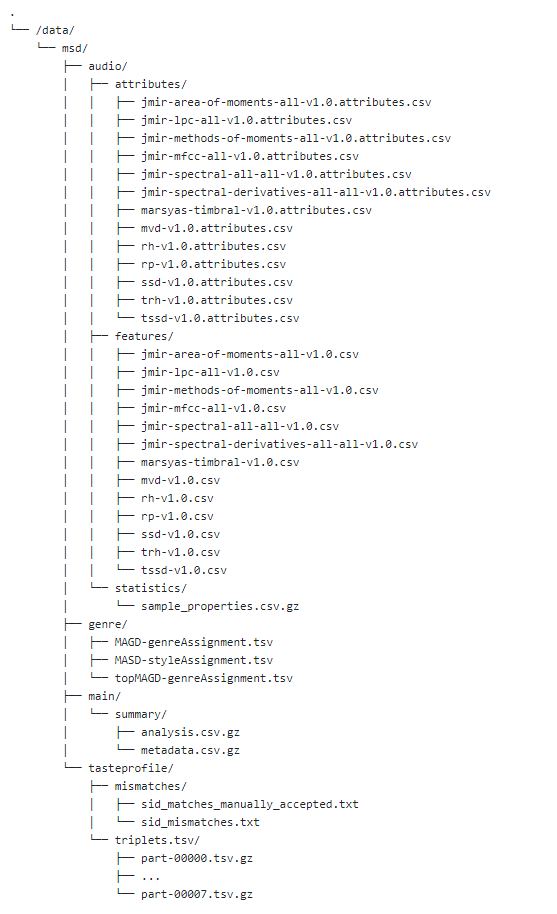

### Looking at the file sizes [✓]

In [31]:
# looking at the sizes of the directories inside the folder "msd"

!hdfs dfs -du -h /data/msd

12.3 G   98.1 G   /data/msd/audio
30.1 M   241.0 M  /data/msd/genre
174.4 M  1.4 G    /data/msd/main
490.4 M  3.8 G    /data/msd/tasteprofile


In [32]:
!hdfs dfs -du -h /data/msd/audio

103.0 K  824.3 K  /data/msd/audio/attributes
12.2 G   97.8 G   /data/msd/audio/features
40.3 M   322.1 M  /data/msd/audio/statistics


In [48]:
!hdfs dfs -du -h /data/msd/genre

11.1 M  88.7 M  /data/msd/genre/msd-MAGD-genreAssignment.tsv
8.4 M   67.3 M  /data/msd/genre/msd-MASD-styleAssignment.tsv
10.6 M  85.0 M  /data/msd/genre/msd-topMAGD-genreAssignment.tsv


In [17]:
!hdfs dfs -du -h /data/msd/main/summary

55.9 M   447.5 M  /data/msd/main/summary/analysis.csv.gz
118.5 M  947.7 M  /data/msd/main/summary/metadata.csv.gz


In [56]:
!hdfs dfs -ls /data/msd/tasteprofile/mismatches

Found 2 items
-rw-r--r--   8 jsw93 supergroup      91342 2021-09-29 10:35 /data/msd/tasteprofile/mismatches/sid_matches_manually_accepted.txt
-rw-r--r--   8 jsw93 supergroup    2026182 2021-09-29 10:35 /data/msd/tasteprofile/mismatches/sid_mismatches.txt


In [57]:
!hdfs dfs -ls /data/msd/tasteprofile/triplets.tsv

Found 8 items
-rw-r--r--   8 jsw93 supergroup   64020759 2021-09-29 10:35 /data/msd/tasteprofile/triplets.tsv/part-00000.tsv.gz
-rw-r--r--   8 jsw93 supergroup   64038083 2021-09-29 10:35 /data/msd/tasteprofile/triplets.tsv/part-00001.tsv.gz
-rw-r--r--   8 jsw93 supergroup   64077499 2021-09-29 10:35 /data/msd/tasteprofile/triplets.tsv/part-00002.tsv.gz
-rw-r--r--   8 jsw93 supergroup   64102442 2021-09-29 10:35 /data/msd/tasteprofile/triplets.tsv/part-00003.tsv.gz
-rw-r--r--   8 jsw93 supergroup   63998697 2021-09-29 10:35 /data/msd/tasteprofile/triplets.tsv/part-00004.tsv.gz
-rw-r--r--   8 jsw93 supergroup   64049032 2021-09-29 10:35 /data/msd/tasteprofile/triplets.tsv/part-00005.tsv.gz
-rw-r--r--   8 jsw93 supergroup   64064101 2021-09-29 10:35 /data/msd/tasteprofile/triplets.tsv/part-00006.tsv.gz
-rw-r--r--   8 jsw93 supergroup   63788582 2021-09-29 10:35 /data/msd/tasteprofile/triplets.tsv/part-00007.tsv.gz


In [55]:
!hdfs dfs -du -h /data/msd/tasteprofile

2.0 M    16.2 M  /data/msd/tasteprofile/mismatches
488.4 M  3.8 G   /data/msd/tasteprofile/triplets.tsv


### Figuring out how to read the datasets in the `genre` directory and counting rows [✓]

Helpful links - 
- http://www.ifs.tuwien.ac.at/mir/msd/MAGD.html
- http://www.ifs.tuwien.ac.at/mir/msd/TopMAGD.html
- http://www.ifs.tuwien.ac.at/mir/msd/MASD.html


In [65]:
!hdfs dfs -cat /data/msd/genre/msd-MAGD-genreAssignment.tsv

TRAAAAK128F9318786	Pop_Rock
TRAAAAV128F421A322	Pop_Rock
TRAAAAW128F429D538	Rap
TRAAABD128F429CF47	Pop_Rock
TRAAACV128F423E09E	Pop_Rock
TRAAADT12903CCC339	Easy_Listening
TRAAAED128E0783FAB	Vocal
TRAAAEF128F4273421	Pop_Rock
TRAAAEM128F93347B9	Electronic
TRAAAFD128F92F423A	Pop_Rock
TRAAAFP128F931B4E3	Rap
TRAAAGR128F425B14B	Pop_Rock
TRAAAGW12903CC1049	Blues
TRAAAHD128F42635A5	Pop_Rock
TRAAAHE12903C9669C	Pop_Rock
TRAAAHJ128F931194C	Pop_Rock
TRAAAHZ128E0799171	Rap
TRAAAIR128F1480971	RnB
TRAAAJG128F9308A25	Folk
TRAAAMO128F1481E7F	Religious
TRAAAMQ128F1460CD3	Rap
TRAAANK128F428B515	Pop_Rock
TRAAARJ128F9320760	Pop_Rock
TRAAAVO128F93133D4	Pop_Rock
TRAAAZU128F4226F7A	Pop_Rock
TRAABAH128F423B788	Pop_Rock
TRAABBY128F930C3B5	Pop_Rock
TRAABFH128F92C812E	Pop_Rock
TRAABFT128F931150E	Pop_Rock
TRAABGU12903CC8DCF	Pop_Rock
TRAABHC128F933A3F8	Country
TRAABHO12903D08576	Jazz
TRAABIG128F9356C56	Pop_Rock
TRAABIL128F92C1D88	RnB
TRAABJS128F9325C99	Pop_Rock
TRAABJV128F1460C49	RnB
TRAABLR128F423B7E3	Pop_Rock
TRAAB

TRAHRRT128F9339B60	Pop_Rock
TRAHRTD12903CFDAF5	Pop_Rock
TRAHRTM12903CF5FE2	Jazz
TRAHRTR12903CBE092	Blues
TRAHRUE128F424EBAF	Electronic
TRAHRWC128F92D5A54	Rap
TRAHRWM128F932C537	Jazz
TRAHRWR128F428A4A6	Pop_Rock
TRAHRZQ128EF35C314	Pop_Rock
TRAHSEN128F146436E	Electronic
TRAHSEX128F42A373A	Pop_Rock
TRAHSGT128F4238E3F	Pop_Rock
TRAHSHQ128F4259072	Latin
TRAHSIB128E0784FEA	New Age
TRAHSIZ128F149DFBA	Pop_Rock
TRAHSJI128F1496F12	Electronic
TRAHSJO128F424AD9E	Electronic
TRAHSJR12903CBF093	Blues
TRAHSJX128F42914E5	Pop_Rock
TRAHSKL128F42689F7	Pop_Rock
TRAHSQW12903D0232B	Pop_Rock
TRAHSRH128F42202CB	New Age
TRAHSSM128F426588B	Pop_Rock
TRAHSSO128EF347345	Pop_Rock
TRAHSST128F4291FB5	Pop_Rock
TRAHSSY128F9333DA1	Pop_Rock
TRAHSTH128F93261C2	Pop_Rock
TRAHSTL128F931708D	Jazz
TRAHSTO128F4255254	Rap
TRAHSUO128F92FBF03	RnB
TRAHSUU12903CAF509	Pop_Rock
TRAHSYQ12903CBB9F4	Pop_Rock
TRAHSZQ128F427C268	International
TRAHSZS128F428B700	Pop_Rock
TRAHTDA128F147A055	Electronic
TRAHTDJ128F426EF36	Pop_Rock
TRAHTFN128F9330

TRAYUCR128E078EE0F	Pop_Rock
TRAYUCR128F92E574F	Pop_Rock
TRAYUCS128F423EDDE	Pop_Rock
TRAYUDO128F425840B	Pop_Rock
TRAYUEQ128F42660EA	Pop_Rock
TRAYUFE128F933A20D	Stage 
TRAYUFG128F9344448	Vocal
TRAYUFX12903CDCFA6	Pop_Rock
TRAYUII128F4253381	Stage 
TRAYUKR128F9344BB4	Pop_Rock
TRAYUKT128F92E84DA	Electronic
TRAYULJ128F9318A2B	Pop_Rock
TRAYUNC128F92DE84B	Pop_Rock
TRAYUNG128F429766A	Pop_Rock
TRAYUNI128F429BA7B	Rap
TRAYUOL128F93148AE	Pop_Rock
TRAYUOU128F9312994	Pop_Rock
TRAYUSX128F423DBF9	Reggae
TRAYUTH128F423A5CF	Religious
TRAYVCS12903CE1ED8	Reggae
TRAYVCX128F421FDF0	Pop_Rock
TRAYVDO128F930670D	Pop_Rock
TRAYVEL128F149F631	Pop_Rock
TRAYVFQ128F423BA7B	Pop_Rock
TRAYVFZ128F147425B	Pop_Rock
TRAYVGS12903CE4E44	Pop_Rock
TRAYVGV128F92CA4E5	Pop_Rock
TRAYVGW128F1485065	Pop_Rock
TRAYVHU128F932D106	Jazz
TRAYVJI128F931513C	Rap
TRAYVKQ12903CE6B13	Pop_Rock
TRAYVKY128F92D7F96	Electronic
TRAYVKZ128E078C01C	Latin
TRAYVMI12903CED56B	Pop_Rock
TRAYVMU128F92EC210	Pop_Rock
TRAYVNT128F92D5413	Pop_Rock
TRAYVRS128F92F1

TRBZWNI128F14683C3	Pop_Rock
TRBZWNW128E0798C23	Latin
TRBZWPT12903CD5B56	Pop_Rock
TRBZWQI128F4236B37	Jazz
TRBZWRK128F92E73B3	Folk
TRBZWRX128F9366894	Rap
TRBZWSB128F423D3DE	Latin
TRBZWSC128EF3542D9	Pop_Rock
TRBZWUG128F422F3C6	Pop_Rock
TRBZWWX128F92FA6E8	Electronic
TRBZWXF128E07910F9	Easy_Listening
TRBZWXZ128E078779F	Latin
TRBZWYC128F425D089	Pop_Rock
TRBZWYO128F4267455	Pop_Rock
TRBZWYY128F4228954	Latin
TRBZXAA128F93122FA	Jazz
TRBZXAB128F145F4EA	Jazz
TRBZXBX12903CEF5D4	Jazz
TRBZXFP128F426BDFA	Pop_Rock
TRBZXHD128E0782C01	Pop_Rock
TRBZXHO128F934B68B	Pop_Rock
TRBZXLV128F4241B88	Pop_Rock
TRBZXOR12903CE59CC	Pop_Rock
TRBZXPC128F92D810E	Pop_Rock
TRBZXPW128E078CC9F	Pop_Rock
TRBZXRP128F92EFA24	Pop_Rock
TRBZXSO128F932626A	Rap
TRBZXVE128F92C789C	Pop_Rock
TRBZXWO12903CE8631	Pop_Rock
TRBZXZZ128F92D498F	Electronic
TRBZYAV128F426BDB0	Electronic
TRBZYBL128F930D35F	Electronic
TRBZYCO128F4292920	Religious
TRBZYDF128F1497DE6	Pop_Rock
TRBZYEE128F92EF884	New Age
TRBZYEL128F428C24C	Pop_Rock
TRBZYGH128F42667FF	P

TRCYVLA128F92F6E05	Country
TRCYVLU128F93052C8	Rap
TRCYVMG128F423695C	Pop_Rock
TRCYVNB128F9327D06	Country
TRCYVOI128F932E782	Electronic
TRCYVQE128F9327CBC	Pop_Rock
TRCYVSB128F149F0A2	Jazz
TRCYVTK128F427CCE0	Latin
TRCYVWX128F9325337	Pop_Rock
TRCYVXI128F429B73A	Rap
TRCYVXR128F9340CB3	Pop_Rock
TRCYVYQ128F933CC9F	Pop_Rock
TRCYVZK128F9359356	Pop_Rock
TRCYVZW128F9330C00	Pop_Rock
TRCYWAB128F9335243	Rap
TRCYWBY128F9334774	Pop_Rock
TRCYWCW128F428D6B9	Rap
TRCYWCW12903CD1BEC	Pop_Rock
TRCYWCX128F4265B47	Jazz
TRCYWEV12903D07373	Electronic
TRCYWGC128F423D5D9	Jazz
TRCYWHD128F92DE1DC	Jazz
TRCYWKF128F932FF22	Pop_Rock
TRCYWKQ128F148E843	Pop_Rock
TRCYWLI12903CF7AEF	Pop_Rock
TRCYWMZ12903CC239A	Pop_Rock
TRCYWPD12903CC2AE4	Electronic
TRCYWPP128F93316DB	Pop_Rock
TRCYWQD128F4256AF3	Pop_Rock
TRCYWQS128F934ABBE	Pop_Rock
TRCYWRL128F9344913	Pop_Rock
TRCYWRM12903CFE169	Electronic
TRCYWSS128F4245420	Pop_Rock
TRCYWSS128F427B1E0	Electronic
TRCYWTA12903CA6737	Pop_Rock
TRCYWWI12903CBD127	Country
TRCYWXL12903CDC909	Pop_R

TRDZEUR12903CCDE31	Vocal
TRDZEUY128F4296632	Rap
TRDZEWJ12903CB0C78	Electronic
TRDZEWO128F4236F52	Pop_Rock
TRDZEXS128F9334EAA	Pop_Rock
TRDZEXX128F93240B2	Electronic
TRDZEYE128EF362FC4	Pop_Rock
TRDZFDJ128F4272018	Pop_Rock
TRDZFDM128F146EF35	Pop_Rock
TRDZFDP128F9345AF8	Reggae
TRDZFEU128F4233FDF	Pop_Rock
TRDZFFR12903CC6561	Pop_Rock
TRDZFGF128F426C3E8	Pop_Rock
TRDZFIE128EF34EE6C	International
TRDZFKT128F92F53C3	Pop_Rock
TRDZFLV128E078E032	Pop_Rock
TRDZFMS128F9358E70	Pop_Rock
TRDZFPK128F42609C2	Latin
TRDZFQI128F934BE58	Pop_Rock
TRDZFRO128F1488262	New Age
TRDZFTN128F424B630	Latin
TRDZFTP12903CD3D75	Pop_Rock
TRDZFTX128F92F902E	Pop_Rock
TRDZFUD128F92F8B7C	Pop_Rock
TRDZFVJ128F4230FEF	Pop_Rock
TRDZFZL128F429CBB5	Country
TRDZGAN128E078826C	Pop_Rock
TRDZGBB128F92F8D2A	Pop_Rock
TRDZGBN128F4231481	Pop_Rock
TRDZGBO128F147D9BE	Pop_Rock
TRDZGDK12903CABAB5	Pop_Rock
TRDZGDW128F425D2AB	Pop_Rock
TRDZGDW12903CF6C83	International
TRDZGER12903CD386D	Electronic
TRDZGFA128F930D281	Jazz
TRDZGGF128F92DCFEA	RnB
TRD

TREXUKX12903CF8F5C	Blues
TREXUOJ128F92C4997	Pop_Rock
TREXURO128F9324B00	Pop_Rock
TREXURP128F14773E2	Pop_Rock
TREXURV128F424B410	Pop_Rock
TREXURW128F4262D17	Country
TREXUUF128F92CD427	Pop_Rock
TREXUVI128F426335D	Pop_Rock
TREXUWG128F422B530	RnB
TREXUYT128F428E93B	Pop_Rock
TREXUZC12903CEF9C4	Religious
TREXVAV128F427F3D1	Pop_Rock
TREXVBU12903CC000C	Jazz
TREXVDM12903CC729D	Blues
TREXVEZ128F425A389	Pop_Rock
TREXVFQ128F148978E	Latin
TREXVGT128F14A8E6B	RnB
TREXVHK12903CAFDF6	Electronic
TREXVIE128F429E68E	Rap
TREXVKC128F42A1E90	Pop_Rock
TREXVLC128F42AD12E	Pop_Rock
TREXVLG128F4267B8D	Electronic
TREXVNU128F92FB27E	Folk
TREXVNZ128F14ADF0D	Religious
TREXVPX12903CFE362	Pop_Rock
TREXVVW128F427431F	International
TREXVWE128F4277B5E	Pop_Rock
TREXVXI128F426AAA1	Electronic
TREXVXQ128F92DD1D9	Pop_Rock
TREXWAK128F9344B44	Pop_Rock
TREXWAW128F934258E	Pop_Rock
TREXWBB128F9330952	Electronic
TREXWCJ128F423BF72	Folk
TREXWDR128F428BDF3	Pop_Rock
TREXWDZ128F1497DEE	Pop_Rock
TREXWFI128E0794DE5	Pop_Rock
TREXWFS12903CC

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [66]:
!hdfs dfs -cat /data/msd/genre/msd-MASD-styleAssignment.tsv 

TRAAAAK128F9318786	Metal_Alternative
TRAAAAV128F421A322	Punk
TRAAAAW128F429D538	Hip_Hop_Rap
TRAAACV128F423E09E	Rock_Neo_Psychedelia
TRAAAEF128F4273421	Pop_Indie
TRAAAFP128F931B4E3	Hip_Hop_Rap
TRAAAGR128F425B14B	Pop_Contemporary
TRAAAHD128F42635A5	Rock_Hard
TRAAAHJ128F931194C	Pop_Indie
TRAAAHZ128E0799171	Hip_Hop_Rap
TRAAAIR128F1480971	Pop_Contemporary
TRAAAJG128F9308A25	Country_Traditional
TRAAAMO128F1481E7F	Gospel
TRAAAMQ128F1460CD3	Hip_Hop_Rap
TRAAANK128F428B515	Rock_Neo_Psychedelia
TRAAARJ128F9320760	Pop_Contemporary
TRAAAVO128F93133D4	Rock_Neo_Psychedelia
TRAAAZU128F4226F7A	Rock_Alternative
TRAABAH128F423B788	Pop_Indie
TRAABBY128F930C3B5	Rock_Neo_Psychedelia
TRAABFH128F92C812E	Rock_College
TRAABHO12903D08576	Jazz_Classic
TRAABIG128F9356C56	Rock_Alternative
TRAABJS128F9325C99	Rock_College
TRAABJV128F1460C49	Rock_Contemporary
TRAABNV128F425CEE1	Folk_International
TRAABOG128F42955B1	Rock_Contemporary
TRAABPK128F424CFDB	Metal_Death
TRAABPQ128F428F0B0	Pop_Latin
TRAABTZ128F4278C48	Punk
TR

TRBCVQG128F427AAF8	Pop_Indie
TRBCVSA128E0792027	RnB_Soul
TRBCVUW128F1467D97	Rock_Neo_Psychedelia
TRBCVVW128EF3524BB	Rock_College
TRBCVXV128F4262005	Rock_Contemporary
TRBCWCN128F9325FA0	Rock_Alternative
TRBCWGF128F146FFEE	Rock_Contemporary
TRBCWGR128F4220309	Electronica
TRBCWIA128F4220805	Metal_Death
TRBCWJO128F424B4B4	Pop_Contemporary
TRBCWKZ128F42439D3	Rock_College
TRBCWKZ128F93375CF	Metal_Alternative
TRBCWLD128F932AC6A	Gospel
TRBCWMK12903CB24A0	Pop_Indie
TRBCWQC12903CA45DE	Reggae
TRBCWQF128F92E73F2	Country_Traditional
TRBCWQJ128F424E00B	Rock_Contemporary
TRBCWRP128F92FF6F4	Rock_College
TRBCWUW12903CEF1B0	Metal_Heavy
TRBCWVA128F92F2EBD	Metal_Alternative
TRBCWVL128F932090F	Rock_College
TRBCWVZ128F427A8DC	Rock_Hard
TRBCWWH128F424382C	Country_Traditional
TRBCWYJ128F93213A1	Rock_College
TRBCWYY128F933BDD2	Metal_Heavy
TRBCWZW128F933068E	Electronica
TRBCWZZ128F930EDB0	Pop_Latin
TRBCXFE128F424CD00	Pop_Indie
TRBCXFV128F42787C3	Folk_International
TRBCXKW128F428B956	Grunge_Emo
TRBCXMT12903D03F8

TRCHIWU128F93017AB	Pop_Contemporary
TRCHIYO128F92F97B7	Metal_Alternative
TRCHIZQ128F4258558	Punk
TRCHIZT128F426755E	Jazz_Classic
TRCHJBA128F1498780	Electronica
TRCHJBJ128F92FF514	Electronica
TRCHJBQ12903CDF229	Rock_Alternative
TRCHJDD128F932EEEB	Folk_International
TRCHJEB128F92F2E49	Blues_Contemporary
TRCHJEU128F422C4EB	Grunge_Emo
TRCHJGP128F930AB35	Pop_Indie
TRCHJHM128F428A9FB	Punk
TRCHJIF128F93017CC	Rock_College
TRCHJJD128F93270A2	Rock_Alternative
TRCHJNK128F14739A0	Pop_Indie
TRCHJNR128F148A605	Grunge_Emo
TRCHJOM12903CC45BD	Country_Traditional
TRCHJOR128F425A44E	Gospel
TRCHJPK128F426220D	Punk
TRCHJQL128F145A5BF	Rock_College
TRCHJQV128F93504F7	Pop_Indie
TRCHJRE12903CCEE51	Rock_College
TRCHJRN128F42AF15D	Hip_Hop_Rap
TRCHJUC128F93343EC	Blues_Contemporary
TRCHJVK128F42768C1	Experimental
TRCHJZS128EF3460BD	Rock_Alternative
TRCHKAF12903CF3686	Pop_Contemporary
TRCHKDF128F147E6A2	Metal_Heavy
TRCHKEH128E07956A0	Dance
TRCHKEI128F423EB30	Rock_College
TRCHKEM12903CDD644	Metal_Alternative
TRCHKEQ

TRDJEIJ128F92FDE4D	Pop_Indie
TRDJEJD128F92DC2B2	Blues_Contemporary
TRDJEJV128F4263881	Rock_Alternative
TRDJEKW128F428A829	Rock_Neo_Psychedelia
TRDJELE12903D00F0A	Hip_Hop_Rap
TRDJEML128F92F23DD	Punk
TRDJEMZ128F93353FA	Rock_Contemporary
TRDJEOB12903CDA133	Electronica
TRDJERY128F42633EC	Experimental
TRDJEUF12903CAEB8E	Metal_Heavy
TRDJEWA12903CE000A	Blues_Contemporary
TRDJEXQ12903CC077F	Jazz_Classic
TRDJEZS128F429D1E8	Rock_Contemporary
TRDJFAJ12903CFECF9	Experimental
TRDJFBM128F933F817	Electronica
TRDJFBO12903C9AB8A	Metal_Alternative
TRDJFCA128F92C5F82	Gospel
TRDJFEV128EF351B61	Electronica
TRDJFJK128F424DB21	Grunge_Emo
TRDJFKF12903CC42A1	Dance
TRDJFKQ128F9326F4F	Grunge_Emo
TRDJFPZ128F9328BF3	Metal_Alternative
TRDJFSA12903CC04E1	Hip_Hop_Rap
TRDJFSX128EF352438	Pop_Indie
TRDJFTF128F4266802	Folk_International
TRDJFTN128F4254BF7	Dance
TRDJFTX128F92F8F3E	Pop_Indie
TRDJFUE128F932653B	Rock_Neo_Psychedelia
TRDJFVU128F92FD62A	Blues_Contemporary
TRDJFVY128F146C16E	Folk_International
TRDJGAV128F426964

TREKJYM128F930A538	Rock_Alternative
TREKKBF128F93384DF	Folk_International
TREKKBI128F931A98A	Hip_Hop_Rap
TREKKBV128F14AB74B	Jazz_Classic
TREKKFM128F42B2E5E	Rock_Contemporary
TREKKGE128F9333F2A	Experimental
TREKKII128F92E32EF	Metal_Death
TREKKMX128E07824D9	Rock_Contemporary
TREKKPB128F423EE77	Rock_Hard
TREKKQN128F4263AB3	Pop_Contemporary
TREKKSE128F1487DF0	Rock_Contemporary
TREKKUM128F426EB84	Hip_Hop_Rap
TREKKYO12903CB0F4A	Blues_Contemporary
TREKKZK128EF3427A1	Rock_Hard
TREKLAQ128F92FB0DF	Country_Traditional
TREKLBN128F9311DEB	Rock_Alternative
TREKLCE12903CC924E	Dance
TREKLEO128F1459433	Dance
TREKLFO128F4282680	Rock_Hard
TREKLGS128F423D073	Pop_Latin
TREKLGZ128F428DF41	Hip_Hop_Rap
TREKLHM12903CD3DAD	Blues_Contemporary
TREKLIA128F42A1EC9	Rock_Hard
TREKLIT128F9336365	Dance
TREKLLU128F4267EB4	Rock_Contemporary
TREKLMO128F1451688	Pop_Contemporary
TREKLNI128F422F35E	Metal_Heavy
TREKLVJ128F42BA8CB	Pop_Indie
TREKLWN128EF33F032	Metal_Death
TREKLWQ128F14A27C4	Big_Band
TREKLXN12903CAFC43	Experimen

TRFRLKP128F426D81D	Dance
TRFRLKV128F4277372	Rock_Contemporary
TRFRLNY128F92FB91B	Jazz_Classic
TRFRLQO128F422F3D1	Metal_Alternative
TRFRLRI128F429C2C8	Dance
TRFRLSM12903CF2D6D	Pop_Indie
TRFRLSR128F42437B0	Pop_Indie
TRFRLUK128F9313155	Rock_Contemporary
TRFRLYP128F92DEA24	Metal_Alternative
TRFRLZZ128F9313BAE	Punk
TRFRMCB128F92C3280	Rock_Alternative
TRFRMCL12903CBB78C	Experimental
TRFRMDD128F428E0FA	Grunge_Emo
TRFRMHH128F4260564	Folk_International
TRFRMKV128F4263EA0	Rock_Contemporary
TRFRMMA128F9329810	Metal_Alternative
TRFRMPA128F428B04E	Hip_Hop_Rap
TRFRMQG128F93442BA	Rock_Hard
TRFRMQN128F9339607	Rock_Hard
TRFRMRJ128F42B78BB	Pop_Contemporary
TRFRMSD128F4289480	Metal_Alternative
TRFRMVL128F930CEA0	Pop_Contemporary
TRFRNEJ128F4240889	Metal_Alternative
TRFRNEM128F14863EB	Rock_College
TRFRNGQ128F4256F33	Metal_Heavy
TRFRNHC128F42583AD	Electronica
TRFRNJL12903CF5BCA	Metal_Death
TRFRNNO128F4241539	Rock_Neo_Psychedelia
TRFRNNY128F422BFCF	Metal_Alternative
TRFRNNZ128F145B457	Rock_Contemporary
TRFR

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Metal_Alternative
TRZYEFS128F42336CC	Rock_College
TRZYEHH128F4257DA4	Metal_Heavy
TRZYEKS128F14A72BC	Folk_International
TRZYENJ128F934796F	Grunge_Emo
TRZYENW128E0788B29	Punk
TRZYEOF128F423C5DB	Pop_Contemporary
TRZYEOI12903CDB5A6	Metal_Heavy
TRZYEOY128F426AA09	Metal_Heavy
TRZYEQK12903CE3CDD	Metal_Alternative
TRZYERC128F1472ADE	Rock_Neo_Psychedelia
TRZYESQ128F92F96D4	Rock_Neo_Psychedelia
TRZYESS128F931298F	Metal_Heavy
TRZYEUM128E0785DCD	Pop_Indie
TRZYEUM128F422BD98	Pop_Indie
TRZYEUT128F4242CB7	Rock_Contemporary
TRZYEVA12903CE43B0	Metal_Alternative
TRZYEWH128F424BDAF	Pop_Indie
TRZYEWT128F42514DE	Gospel
TRZYEXE128F92DAF2E	Metal_Death
TRZYFBE12903C9B44E	Metal_Heavy
TRZYFFT12903CD3D70	Pop_Indie
TRZYFGA128F4275ED9	Rock_Alternative
TRZYFGL128F92D4FCC	Electronica
TRZYFHK128F930ECDA	Rock_Contemporary
TRZYFID128F422F952	Country_Traditional
TRZYFIQ128F4250D40	Electronica
TRZYFKK128F93427E8	Pop_Contemporary
TRZYFMB12903CEDA1D	Rock_College
TRZYFNJ128F145F507	Pop_Latin
TRZYFOE128F4268FD8	Hip_Hop_Rap
T

In [45]:
!hdfs dfs -cat /data/msd/genre/msd-topMAGD-genreAssignment.tsv

TRAAAAK128F9318786	Pop_Rock
TRAAAAV128F421A322	Pop_Rock
TRAAAAW128F429D538	Rap
TRAAABD128F429CF47	Pop_Rock
TRAAACV128F423E09E	Pop_Rock
TRAAAED128E0783FAB	Vocal
TRAAAEF128F4273421	Pop_Rock
TRAAAEM128F93347B9	Electronic
TRAAAFD128F92F423A	Pop_Rock
TRAAAFP128F931B4E3	Rap
TRAAAGR128F425B14B	Pop_Rock
TRAAAGW12903CC1049	Blues
TRAAAHD128F42635A5	Pop_Rock
TRAAAHE12903C9669C	Pop_Rock
TRAAAHJ128F931194C	Pop_Rock
TRAAAHZ128E0799171	Rap
TRAAAIR128F1480971	RnB
TRAAAJG128F9308A25	Folk
TRAAAMQ128F1460CD3	Rap
TRAAANK128F428B515	Pop_Rock
TRAAARJ128F9320760	Pop_Rock
TRAAAVO128F93133D4	Pop_Rock
TRAAAZU128F4226F7A	Pop_Rock
TRAABAH128F423B788	Pop_Rock
TRAABBY128F930C3B5	Pop_Rock
TRAABFH128F92C812E	Pop_Rock
TRAABFT128F931150E	Pop_Rock
TRAABGU12903CC8DCF	Pop_Rock
TRAABHC128F933A3F8	Country
TRAABHO12903D08576	Jazz
TRAABIG128F9356C56	Pop_Rock
TRAABIL128F92C1D88	RnB
TRAABJS128F9325C99	Pop_Rock
TRAABJV128F1460C49	RnB
TRAABLR128F423B7E3	Pop_Rock
TRAABNV128F425CEE1	New Age
TRAABOG128F42955B1	Pop_Rock
TRAABOW128F42

TRASQOS128F427FB1B	Pop_Rock
TRASQPP128F4259D4B	Pop_Rock
TRASQTI12903D048F4	Rap
TRASQTU128F421351F	Rap
TRASQUN128E079905E	Pop_Rock
TRASQZF128F92F3078	Pop_Rock
TRASQZQ128F147C7B0	RnB
TRASQZS128F932173B	Pop_Rock
TRASRAV128F4251097	Reggae
TRASRAW12903CE4566	Pop_Rock
TRASRBE128E0792077	Pop_Rock
TRASRBM128F9314505	Pop_Rock
TRASRCS12903D0D94B	Pop_Rock
TRASREG128F9336C73	Pop_Rock
TRASREI128F9336F03	Latin
TRASRGS128F4272823	Country
TRASRIM128F932ADB8	Pop_Rock
TRASRJM128EF3553D9	New Age
TRASRKQ128F930D7E2	Country
TRASRLB128F42605AA	Pop_Rock
TRASRMI128F425ECB1	Latin
TRASRMP128F42634E9	Pop_Rock
TRASRNE128F9304FAD	Pop_Rock
TRASRNF128F934F151	Latin
TRASRNR128F4281034	Pop_Rock
TRASRNY12903CD3274	International
TRASROV128F932DC5B	Pop_Rock
TRASRRK128EF35A359	Pop_Rock
TRASRRY128F42BABD9	Pop_Rock
TRASRSL12903CEE746	Pop_Rock
TRASRSO128F9359BC8	Pop_Rock
TRASRTG12903CF34DA	Electronic
TRASRTM128F42892D2	Pop_Rock
TRASRTV128F9350211	Pop_Rock
TRASRVD128F933624A	International
TRASRVH128F4271E4A	Pop_Rock
TRASRZM12

TRBVTJB12903CAEF98	Pop_Rock
TRBVTLT128F93362AB	Pop_Rock
TRBVTMM12903CCFC81	Pop_Rock
TRBVTMV128F934755B	Pop_Rock
TRBVTMW128F935A613	Pop_Rock
TRBVTOG128F930F788	Reggae
TRBVTOW128F425D08B	Pop_Rock
TRBVTQH128F148D6C9	Rap
TRBVTQP128F4266549	Country
TRBVTQQ128E0787D56	Pop_Rock
TRBVTTG12903CBFC2B	Electronic
TRBVTUD128F424DD0A	Pop_Rock
TRBVTUJ128F147DAA5	Pop_Rock
TRBVTUS128F932A303	Pop_Rock
TRBVTWZ128EF35F246	Pop_Rock
TRBVTXT12903D05EE0	Electronic
TRBVUBE128F4262898	Pop_Rock
TRBVUBM128F4271B7E	Rap
TRBVUEK128F147FBE3	Pop_Rock
TRBVUFE128F92F66F4	Latin
TRBVUGU128F42222FD	Rap
TRBVUHM128F92C537B	Pop_Rock
TRBVUHO128F4292A91	Pop_Rock
TRBVUHR128F422954C	Electronic
TRBVUHU128F146827F	Pop_Rock
TRBVUIO12903CCF458	Latin
TRBVUIT128E07938EC	Pop_Rock
TRBVUIX128F9343A1F	Pop_Rock
TRBVUIY12903CBD5BB	Pop_Rock
TRBVUJD128F9307BF0	Electronic
TRBVUJT128F422C35C	Pop_Rock
TRBVUJX128F4254F0E	Pop_Rock
TRBVUJY128F4252CB1	International
TRBVUKK128F932DDA3	Pop_Rock
TRBVULF128F93537E6	Folk
TRBVUMO12903CBB184	Pop_Rock
TRBVUPX

TRCYBDH128F42915D5	Pop_Rock
TRCYBFC128F428AC81	Pop_Rock
TRCYBGA128F429B31A	Pop_Rock
TRCYBGX128F92C6905	Pop_Rock
TRCYBHF128E078A33B	Pop_Rock
TRCYBHY128F427BAEE	International
TRCYBIM12903CB4AAF	Jazz
TRCYBLB128F1484390	Jazz
TRCYBLN12903CC8B86	International
TRCYBNA128F1459AE0	Pop_Rock
TRCYBNI128F92F9856	International
TRCYBPQ128E07925F8	Pop_Rock
TRCYBPX128F933F8FF	Electronic
TRCYBRF12903D0881E	Electronic
TRCYBRM128F42AD988	Electronic
TRCYBRM128F9334798	Electronic
TRCYBSR128F930FD44	Rap
TRCYBTD12903CF37BD	Blues
TRCYBTP128F148AD8D	Pop_Rock
TRCYBUY12903CC46D1	Country
TRCYBXB128F424BDB1	Pop_Rock
TRCYBXF128F4216C87	Rap
TRCYBXR128F932DF21	International
TRCYBXU128F932F832	RnB
TRCYBYQ12903CD9A60	Electronic
TRCYBYV128F9331992	Pop_Rock
TRCYBZO128F92F9988	Folk
TRCYCAD12903CA4FF6	Pop_Rock
TRCYCAF12903CF241B	International
TRCYCBS128F1458428	Pop_Rock
TRCYCCT128F145E0F2	Electronic
TRCYCEO12903CF3153	Electronic
TRCYCEZ128F4241BA2	Pop_Rock
TRCYCFM128F931AAB0	Pop_Rock
TRCYCHX128EF360188	Pop_Rock
TRCYCKF12903

TRDYZFK128F4254BFC	Pop_Rock
TRDYZGZ128F934B7CC	Pop_Rock
TRDYZHA12903CAF583	Pop_Rock
TRDYZIN128F14A8A07	Pop_Rock
TRDYZJE128E0781812	Pop_Rock
TRDYZJG128E0784CBE	RnB
TRDYZMF12903CDFE3D	Electronic
TRDYZOJ128F4279769	International
TRDYZOZ128F428CB7C	Pop_Rock
TRDYZPO128F92C3BB1	Electronic
TRDYZSA12903CF2FC4	Pop_Rock
TRDYZTA128F92F4501	Pop_Rock
TRDYZTN128F149C83C	Pop_Rock
TRDYZUL12903CBF496	Rap
TRDYZVF128F4249C61	Pop_Rock
TRDYZVM128F4281110	Pop_Rock
TRDYZWP128F424E5CA	Pop_Rock
TRDYZXV12903CD9E55	Electronic
TRDYZYL128F934C4E8	Electronic
TRDYZYY128F4284F78	Pop_Rock
TRDYZZZ128EF33DF04	Pop_Rock
TRDZABL12903CB4894	Pop_Rock
TRDZACX128F93010BC	Pop_Rock
TRDZAFF12903D1610A	Pop_Rock
TRDZAGU128F1472004	Pop_Rock
TRDZAIX12903CB6FE6	International
TRDZAJW128F93568C0	Electronic
TRDZAKN128F148F50A	Pop_Rock
TRDZALX12903CE727F	Pop_Rock
TRDZAMO128F931E133	New Age
TRDZAMR128EF364440	Pop_Rock
TRDZANK12903CA7342	Pop_Rock
TRDZANR128F425A83B	Pop_Rock
TRDZAPG128F92CDA38	Latin
TRDZAPR12903C9D5FC	Pop_Rock
TRDZAPU12903CA

TREXFNV12903CDB20C	Pop_Rock
TREXFOC128F42925F4	Electronic
TREXFOE128F4252DAB	Folk
TREXFQD128F422B2B4	Pop_Rock
TREXFUF128F92E9D27	Rap
TREXFVE128F4238515	Pop_Rock
TREXFVI128F9349F40	Electronic
TREXFWC128F4275756	Electronic
TREXFWD128F9335C75	Pop_Rock
TREXFWP128F145FE49	Pop_Rock
TREXFXQ128E0792C35	Reggae
TREXFYT128F42283DF	Jazz
TREXFZD128F9341D53	RnB
TREXGAJ12903CF5303	Rap
TREXGAL12903CF1603	Pop_Rock
TREXGBI128E0783D1C	Latin
TREXGCQ128F4288F9A	Pop_Rock
TREXGDQ128F4278BF9	Pop_Rock
TREXGES128F427025E	Pop_Rock
TREXGEV128F4288A2D	Pop_Rock
TREXGEZ12903CC867F	Pop_Rock
TREXGGR128F145692C	Pop_Rock
TREXGME128F4277578	Pop_Rock
TREXGMK128F92F27B9	Electronic
TREXGNC12903CAE3B0	Pop_Rock
TREXGOH128F932FB94	Pop_Rock
TREXGOL12903CDCABA	Pop_Rock
TREXGRV128F42A7061	RnB
TREXGVN12903CDFE13	Electronic
TREXGXH128F4253E08	Electronic
TREXHAU128EF366BEC	Latin
TREXHBO128F422F2C5	Pop_Rock
TREXHCE128F9339EF0	Pop_Rock
TREXHCU128F931698D	Latin
TREXHDI128F92C824B	Pop_Rock
TREXHED128F42392AA	Pop_Rock
TREXHFV12903CDA7F5	

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [1020]:
# Read the TSV file into a DataFrame

magd_schema = StructType([
    StructField("track_id", StringType(), True),
    StructField("genre", StringType(), True)
])

magd_df= (
    spark.read.format("com.databricks.spark.csv")
    .option("delimiter", "\t")
    .option("header", "false")
    .option("inferSchema", "false")
    .schema(magd_schema)
    .load("hdfs:///data/msd/genre/msd-MAGD-genreAssignment.tsv")
)

# Show the first few rows of the DataFrame
magd_df.show()


+------------------+--------------+
|          track_id|         genre|
+------------------+--------------+
|TRAAAAK128F9318786|      Pop_Rock|
|TRAAAAV128F421A322|      Pop_Rock|
|TRAAAAW128F429D538|           Rap|
|TRAAABD128F429CF47|      Pop_Rock|
|TRAAACV128F423E09E|      Pop_Rock|
|TRAAADT12903CCC339|Easy_Listening|
|TRAAAED128E0783FAB|         Vocal|
|TRAAAEF128F4273421|      Pop_Rock|
|TRAAAEM128F93347B9|    Electronic|
|TRAAAFD128F92F423A|      Pop_Rock|
|TRAAAFP128F931B4E3|           Rap|
|TRAAAGR128F425B14B|      Pop_Rock|
|TRAAAGW12903CC1049|         Blues|
|TRAAAHD128F42635A5|      Pop_Rock|
|TRAAAHE12903C9669C|      Pop_Rock|
|TRAAAHJ128F931194C|      Pop_Rock|
|TRAAAHZ128E0799171|           Rap|
|TRAAAIR128F1480971|           RnB|
|TRAAAJG128F9308A25|          Folk|
|TRAAAMO128F1481E7F|     Religious|
+------------------+--------------+
only showing top 20 rows



In [141]:
print(f"Unique genres in MAGD - {magd_df.select('genre').distinct().count()}")

Unique genres in MAGD - 21


In [144]:
print(f"Unique tracks in MAGD - {magd_df.select('track_id').distinct().count()}")

Unique tracks in MAGD - 422714


In [1021]:
masd_schema = StructType([
    StructField("track_id", StringType(), True),
    StructField("style", StringType(), True)
])

masd_df= (
    spark.read.format("com.databricks.spark.csv")
    .option("delimiter", "\t")
    .option("header", "false")
    .option("inferSchema", "false")
    .schema(masd_schema)
    .load("hdfs:///data/msd/genre/msd-MASD-styleAssignment.tsv")
)


# Show the first few rows of the DataFrame
masd_df.show()

+------------------+--------------------+
|          track_id|               style|
+------------------+--------------------+
|TRAAAAK128F9318786|   Metal_Alternative|
|TRAAAAV128F421A322|                Punk|
|TRAAAAW128F429D538|         Hip_Hop_Rap|
|TRAAACV128F423E09E|Rock_Neo_Psychedelia|
|TRAAAEF128F4273421|           Pop_Indie|
|TRAAAFP128F931B4E3|         Hip_Hop_Rap|
|TRAAAGR128F425B14B|    Pop_Contemporary|
|TRAAAHD128F42635A5|           Rock_Hard|
|TRAAAHJ128F931194C|           Pop_Indie|
|TRAAAHZ128E0799171|         Hip_Hop_Rap|
|TRAAAIR128F1480971|    Pop_Contemporary|
|TRAAAJG128F9308A25| Country_Traditional|
|TRAAAMO128F1481E7F|              Gospel|
|TRAAAMQ128F1460CD3|         Hip_Hop_Rap|
|TRAAANK128F428B515|Rock_Neo_Psychedelia|
|TRAAARJ128F9320760|    Pop_Contemporary|
|TRAAAVO128F93133D4|Rock_Neo_Psychedelia|
|TRAAAZU128F4226F7A|    Rock_Alternative|
|TRAABAH128F423B788|           Pop_Indie|
|TRAABBY128F930C3B5|Rock_Neo_Psychedelia|
+------------------+--------------

In [142]:
print(f"Unique styles in MASD - {masd_df.select('style').distinct().count()}")

Unique styles in MASD - 25


In [1022]:
# reading the top-magd dataset

top_magd_schema = StructType([
    StructField("track_id", StringType(), True),
    StructField("genre", StringType(), True)
])

top_magd_df= (
    spark.read.format("com.databricks.spark.csv")
    .option("delimiter", "\t")
    .option("header", "false")
    .option("inferSchema", "false")
    .schema(top_magd_schema)
    .load("hdfs:///data/msd/genre/msd-topMAGD-genreAssignment.tsv")
)


# Show the first few rows of the DataFrame
top_magd_df.show()

+------------------+----------+
|          track_id|     genre|
+------------------+----------+
|TRAAAAK128F9318786|  Pop_Rock|
|TRAAAAV128F421A322|  Pop_Rock|
|TRAAAAW128F429D538|       Rap|
|TRAAABD128F429CF47|  Pop_Rock|
|TRAAACV128F423E09E|  Pop_Rock|
|TRAAAED128E0783FAB|     Vocal|
|TRAAAEF128F4273421|  Pop_Rock|
|TRAAAEM128F93347B9|Electronic|
|TRAAAFD128F92F423A|  Pop_Rock|
|TRAAAFP128F931B4E3|       Rap|
|TRAAAGR128F425B14B|  Pop_Rock|
|TRAAAGW12903CC1049|     Blues|
|TRAAAHD128F42635A5|  Pop_Rock|
|TRAAAHE12903C9669C|  Pop_Rock|
|TRAAAHJ128F931194C|  Pop_Rock|
|TRAAAHZ128E0799171|       Rap|
|TRAAAIR128F1480971|       RnB|
|TRAAAJG128F9308A25|      Folk|
|TRAAAMQ128F1460CD3|       Rap|
|TRAAANK128F428B515|  Pop_Rock|
+------------------+----------+
only showing top 20 rows



In [143]:
print(f"Unique genres in Top MAGD - {top_magd_df.select('genre').distinct().count()}")

Unique genres in Top MAGD - 13


In [139]:
print(f"No. of rows in the MAGD dataset- {magd_df.count()}")
print(f"No. of rows in the MASD dataset- {masd_df.count()}")
print(f"No. of rows in the top-MAGD dataset- {top_magd_df.count()}")

No. of rows in the MAGD dataset- 422714
No. of rows in the MASD dataset- 273936
No. of rows in the top-MAGD dataset- 406427


### Figuring out how to read the datasets in the `main` directory and counting rows [✓]

Helpful links - 
- http://millionsongdataset.com/sites/default/files/AdditionalFiles/FileSchema.pdf
- http://millionsongdataset.com/sites/default/files/AdditionalFiles/unique_tracks.txt
- http://millionsongdataset.com/pages/example-track-description/ -an explanation of the columns

It seems that the order of the songs is the same in analysis_df and metadata_df. maybe i can just put them side by side and get the big dataframe, or maybe i can add index information to boththe dataframes to join them, becasue there's a lak of a commo column.

[!!!] need to figure out what these columns mean. why does analysis_df have track_id, while the metadata_df have song_id? am i required to join these 2 dataframes?

also analysis_df has 1000000 unique TRACKS. but metadata df has 998,963 unique songs even though it has 1,000,000 rows.

In [116]:
analysis_df= (
    spark.read.format("com.databricks.spark.csv")
    .option("header", "true")
    .option("inferSchema", "true")
    .load("hdfs:///data/msd/main/summary/analysis.csv.gz")
)
analysis_df.show()


+--------------------+--------------------+------------+---------+--------------+------+-------------------+--------------+--------------------+---------------+-----------------------+------------------+-----------------------+-------------------------+------------------------------+---------------------------+--------------------+------------------+-------------------+---------------------+----------------+---+--------------+--------+----+---------------+-----------------+-------+--------------+-------------------------+------------------+
|analysis_sample_rate|           audio_md5|danceability| duration|end_of_fade_in|energy|idx_bars_confidence|idx_bars_start|idx_beats_confidence|idx_beats_start|idx_sections_confidence|idx_sections_start|idx_segments_confidence|idx_segments_loudness_max|idx_segments_loudness_max_time|idx_segments_loudness_start|idx_segments_pitches|idx_segments_start|idx_segments_timbre|idx_tatums_confidence|idx_tatums_start|key|key_confidence|loudness|mode|mode_conf

In [132]:
print(f"No. of rows in analysis_df dataset- {analysis_df.count()}")
print(f"No. of columns in analysis_df dataset- {len(analysis_df.columns)}")

No. of rows in analysis_df dataset- 1000000
No. of columns in analysis_df dataset- 31


In [117]:
analysis_df.columns

['analysis_sample_rate',
 'audio_md5',
 'danceability',
 'duration',
 'end_of_fade_in',
 'energy',
 'idx_bars_confidence',
 'idx_bars_start',
 'idx_beats_confidence',
 'idx_beats_start',
 'idx_sections_confidence',
 'idx_sections_start',
 'idx_segments_confidence',
 'idx_segments_loudness_max',
 'idx_segments_loudness_max_time',
 'idx_segments_loudness_start',
 'idx_segments_pitches',
 'idx_segments_start',
 'idx_segments_timbre',
 'idx_tatums_confidence',
 'idx_tatums_start',
 'key',
 'key_confidence',
 'loudness',
 'mode',
 'mode_confidence',
 'start_of_fade_out',
 'tempo',
 'time_signature',
 'time_signature_confidence',
 'track_id']

In [118]:
# checking how many unique tracks are there

unique_track_ids_count = analysis_df.select("track_id").distinct().count()
print("Number of unique track IDs: ", unique_track_ids_count)

Number of unique track IDs:  1000000


In [113]:
metadata_df= (
    spark.read.format("com.databricks.spark.csv")
    .option("header", "true")
    .option("inferSchema", "true")
    .load("hdfs:///data/msd/main/summary/metadata.csv.gz")
)
metadata_df.show()

+----------------+-----------------+-------------------+-------------------+------------------+---------------+--------------------+----------------+--------------------+--------------------+---------------+-----+----------------+-------------------+--------------------+------------------+-------------------+------------------+--------------------+----------------+
|analyzer_version|artist_7digitalid| artist_familiarity|  artist_hotttnesss|         artist_id|artist_latitude|     artist_location|artist_longitude|         artist_mbid|         artist_name|artist_playmeid|genre|idx_artist_terms|idx_similar_artists|             release|release_7digitalid|    song_hotttnesss|           song_id|               title|track_7digitalid|
+----------------+-----------------+-------------------+-------------------+------------------+---------------+--------------------+----------------+--------------------+--------------------+---------------+-----+----------------+-------------------+--------------

In [131]:
print(f"No. of rows in metadata_df dataset- {metadata_df.count()}")
print(f"No. of columns in metadata_df dataset- {len(metadata_df.columns)}")

No. of rows in metadata_df dataset- 1000000
No. of columns in metadata_df dataset- 20


In [115]:
metadata_df.columns

['analyzer_version',
 'artist_7digitalid',
 'artist_familiarity',
 'artist_hotttnesss',
 'artist_id',
 'artist_latitude',
 'artist_location',
 'artist_longitude',
 'artist_mbid',
 'artist_name',
 'artist_playmeid',
 'genre',
 'idx_artist_terms',
 'idx_similar_artists',
 'release',
 'release_7digitalid',
 'song_hotttnesss',
 'song_id',
 'title',
 'track_7digitalid']

In [119]:
# checking how many unique songs are there

unique_song_ids_count = metadata_df.select("song_id").distinct().count()
print("Number of unique song IDs:", unique_song_ids_count)

Number of unique song IDs: 998963


### Figuring out how to read the datasets in the `tasteprofile` directory and counting rows [✓]

Helpful links- http://millionsongdataset.com/tasteprofile/

[!!!] what are the column names? i need to understand mismatches and how to deal with them.

what are the manually accepted songs?

and what are sid mismatches?

how many songs are mismatched? is i total mismatches - manually accepted?

what is the proportion os mismached songs? how many songs are actually there and does it matter if this numberof songs are mismatched?

how do i figure out what is the correct song id for a given track id? if the MSD contains the wrong song-track pair, then where do I find the correct matches?

In [73]:
!hdfs dfs -cat /data/msd/tasteprofile/mismatches/sid_matches_manually_accepted.txt

9d8
< ERROR: <SOFQHZM12A8C142342 TRMWMFG128F92FFEF2> Josipa Lisac  -  razloga  !=  Lisac Josipa  -  1000 razloga
19d17
< ERROR: <SODXUTF12AB018A3DA TRMWPCD12903CCE5ED> Lutan Fyah  -  Nuh Matter the Crisis Feat. Midnite  !=  Midnite  -  Nah Matter the Crisis
29d26
< ERROR: <SOASCRF12A8C1372E6 TRMHIPJ128F426A2E2> Gaetano Donizetti  -  L'Elisir d'Amore: Act Two: Come sen va contento!  !=  Gianandrea Gavazzeni_ Orchestra E Coro Del Maggio Musicale Fiorentino_ Carlo Bergonzi_ Renata Scotto  -  L'Elisir D'Amore_ Act 2: Come Sen Va Contento (Adina) (Donizetti)
33d29
< ERROR: <SOITDUN12A58A7AACA TRMHXGK128F42446AB> C.J. Chenier  -  Ay, Ai Ai  !=  Clifton Chenier  -  Ay_ Ai Ai
52d47
< ERROR: <SOLZXUM12AB018BE39 TRMRSOF12903CCF516> 許志安  -  男人最痛  !=  Andy Hui  -  Nan Ren Zui Tong
126d120
< ERROR: <SOTJTDT12A8C13A8A6 TRMNKQE128F427C4D8> S  -  h  !=  Sammy Hagar  -  20th Century Man (Live)
153d146
< ERROR: <SOGCVWB12AB0184CE2 TRMUNCZ128F932A95D> H  -  Y  !=  Hawkwind  -  25 Years (Alternate Mix)
23

< ERROR: <SOBWGGL12A8BED748D TRTWRPT128F4260230> The Classic Orchestra  -  Die Zauberflöte : Dies Bildnis ist bezaubernd schön  !=  Anton Dermota/Wiener Philharmoniker/Herbert von Karajan  -  Die Zauberflöte (1999 Digital Remaster)_ Act One: Dies Bildnis ist bezaubernd schön (Tamino)
3421d3185
< ERROR: <SOJFGHO12AC9073050 TRTHGXI12903D020D9> Neil Wright  -  I Yi Yi Yi Yi (I Like You Very Much)  !=  Carmen Miranda  -  I_ Yi_ Yi_ Yi_ Yi (I Like You Very Much)
3430d3193
< ERROR: <SOMXUMY12AB0184DD1 TRTCMUY128F932B818> Schuch & Darlington & Lonquich & Hamelin & Sloane  -  Piano Concerto No 5 in F op. 103 -: Allegro animato (1)  !=  Marc-André Hamelin & Steven Sloane & Bochumer Sinfoniker  -  Saint-Saens_ Camille: Piano Concerto No 5 in F op. 103 - Allegro animato (1)
3449d3211
< ERROR: <SOKQYVP12A8C13C51D TRTBAWB128F42A0B4E> 蔡旻佑  -  Ren  !=  Evan Yo  -  2 Ren
3458d3219
< ERROR: <SOQEQIO12AB017C810 TRTFTJP128F92FDD45> Frederik die kleine Maus  -  Hopp,Hopp,Hopp (original)  !=  Frederik  -  

< ERROR: <SOSSHVK12A81C1F84D TRDSAWY128F424FFE3> Sasha  -  & A Half feat. Alexander East (I_  !=  Phonique  -  99 & A Half featuring Alexander East (I:Cube Remix)
5203d4808
< ERROR: <SOPIXCQ12AC4688926 TRDVFDK12903D11270> SinfonieorChester des Hessischen Rundfunks  -  Der Barbier von Bagdad : Act II - Ja, frohe Kunde bring' ih meiner Tochter  !=  Choir and Orchestra des Hessischen Rundfunks_ Otto Matzerath_ Max Noack_ Julia Costa_ Benno Kusche_ Helmut Krebs  -  Der Barbier Von Baghdad: Act II
5208d4812
< ERROR: <SOUWWXG12AB01802DC TRDVDDL128F93466C9> S  -  S  !=  Suzanna Lubrano  -  2 Steps Back
5225d4828
< ERROR: <SOGYGAE12A58A81182 TRDOBJF128F149012E> Chosen Few  -  Me Gustan Todas (Chosen Few Remix) (Feat. Reychesta Secretweapon)  !=  Fuego Featuring Reychesta Secretweapon  -  Me Gustan Todas (Chosen Few Remix) (Explicit) (Feat. Reychesta Secretweapon)
5237d4839
< ERROR: <SOAFRIN12A81C22087 TRDXYEU128F4230531> Frédéric Chopin  -  Waltz No. 7 in c sharp minor, Op. 64,2  !=  Peter Sch

In [95]:
!hdfs dfs -cat /data/msd/tasteprofile/mismatches/sid_matches_manually_accepted.txt | wc -l

938


In [90]:
!hdfs dfs -cat /data/msd/tasteprofile/mismatches/sid_mismatches.txt

ERROR: <SOUMNSI12AB0182807 TRMMGKQ128F9325E10> Digital Underground  -  The Way We Swing  !=  Linkwood  -  Whats up with the Underground
ERROR: <SOCMRBE12AB018C546 TRMMREB12903CEB1B1> Jimmy Reed  -  The Sun Is Shining (Digitally Remastered)  !=  Slim Harpo  -  I Got Love If You Want It
ERROR: <SOLPHZY12AC468ABA8 TRMMBOC12903CEB46E> Africa HiTech  -  Footstep  !=  Marcus Worgull  -  Drumstern (BONUS TRACK)
ERROR: <SONGHTM12A8C1374EF TRMMITP128F425D8D0> Death in Vegas  -  Anita Berber  !=  Valen Hsu  -  Shi Yi
ERROR: <SONGXCA12A8C13E82E TRMMAYZ128F429ECE6> Grupo Exterminador  -  El Triunfador  !=  I Ribelli  -  Lei M'Ama
ERROR: <SOMBCRC12A67ADA435 TRMMNVU128EF343EED> Fading Friend  -  Get us out!  !=  Masterboy  -  Feel The Heat 2000
ERROR: <SOTDWDK12A8C13617B TRMMNCZ128F426FF0E> Daevid Allen  -  Past Lives  !=  Bhimsen Joshi  -  Raga - Shuddha Sarang_ Aalap
ERROR: <SOEBURP12AB018C2FB TRMMPBS12903CE90E1> Cristian Paduraru  -  Born Again  !=  Yespiring  -  Journey Stages
ERROR: <SOSRJHS12A

ERROR: <SOLVVSB12A670209F2 TRFARKC128E078E162> East Coast  -  We Are United (Jochen Miller Remix)  !=  Dancing DJ's v Roxette  -  Fading Like A Flower (Extended Mix)
ERROR: <SOBZBOC12AB01841FF TRFABIK128F9317D0D> Cuckoo  -  Big Nick  !=  Oliver Dodd  -  Snow Day
ERROR: <SOCLQMV12AB018E6C3 TRFAZDA12903CE2CB9> Gyptian  -  In My World  !=  Many More  -  It A Go Red
ERROR: <SOCYUOG12AB0185641 TRFAPGD128F9326E64> Unwound  -  Excuse Me But Pardon My French  !=  Entombed  -  Bitter Loss
ERROR: <SOJYIKZ12A6D4FDDEE TRFAUZO128F422FAC1> Dr. Zeus  -  Shake (Remix 2)  !=  Budoár Staré Dámy  -  V sobotu i v nedeli
ERROR: <SOZYKDF12AB0184EBC TRFAEYK12903CA08DC> Alice Cooper  -  For Alice  !=  The Klone Orchestra  -  I've Written Home To Mother
ERROR: <SOVGGLK12AB0185F99 TRFADIB128F9336CEC> Marco Asoleda  -  Bounce (Jon Virtue Remix)  !=  Edit Select  -  Asperity
ERROR: <SOAWLPP12A8C13E17B TRFNMCS128F4281F49> Half Pint  -  Tell Me  !=  Sly & Robbie  -  Sound Invaders
ERROR: <SOEXAXY12A8C13B391 TRFNIHE

ERROR: <SOUBWLV12AB017A7D4 TROKXYX128F92EAE1B> Kamelancien  -  Yesaï  !=  Bush Chemists  -  Magnet To Steel Dub
ERROR: <SOPXCDO12A8C13687E TROYCMF128F4289215> Racoon  -  Sensacao (Harley & Muscle Deep Mix)  !=  Skrape  -  Stand Up (Summer Song)
ERROR: <SOCLUUM12A6D4FAE57 TROYBQH128F14AB578> Smart Baby Sounds  -  Breath In Breath Out  !=  Geraint Hughes  -  Aquatic Healing
ERROR: <SOYYKQS12AB01880DE TROYFCZ12903CB0645> Carl J. Smith Sr.  -  Holding On  !=  Shaman's Dream  -  Temple Gateways
ERROR: <SOHHFOJ12A8C132C30 TROYAGB128F424F373> Gothic Buddha Masters  -  Chambers Of Mystic  !=  Synaesthesia  -  Surface System
ERROR: <SODENZO12AC9075A7A TROYAEQ12903CE73C3> Elephant Man  -  Log On  !=  Tanto Metro & Devonte  -  Give It To Her
ERROR: <SOKETUJ12A58A78167 TROYUTK128F92F9AFF> Starlite Unlimited  -  Granada  !=  Irina Kircher  -  Suite Espanola_ Op. 47: I. Granada
ERROR: <SORHFNA12A8C13EA77 TROYJCR12903CFCCCD> High Valley  -  The First Noel (Album Version)  !=  Daniel Kirkley  -  Have 

ERROR: <SOWUZGV12A8C13F204 TRREXQR128F429FB66>   -    !=  Paul Van Dyk Featuring Jessica Sutta  -  White Lies (Berlin Mix)
ERROR: <SOGJZUD12A6701E97D TRREXPI128E078EE14>   -    !=  Nirvana  -  Lithium
ERROR: <SOBSARL12A6D4F7E76 TRRJMZB128F14610C2>   -    !=  Diana Krall  -  Deed I Do
ERROR: <SOSQALG12AB01833DB TRRJWUB128F9312A92>   -    !=  Nirvana  -  Breed
ERROR: <SOACWQZ12A67ADE5EC TRRJWHI128F92EB80E>   -    !=  The Smiths  -  William_ It Was Really Nothing
ERROR: <SOMBZTN12D02193825 TRRJGDN128F9327C54>   -    !=  R. Kelly featuring The Notorious B.I.G.  -  (You To Be) Be Happy
ERROR: <SORCPVV129F06A6F35 TRRJHTR12903CAF2EC>   -    !=  Alexandre Desplat  -  N.D.E
ERROR: <SOSLAYB12CF5F86E9F TRRJFTM128F422CF2C>   -    !=  Pink Floyd  -  Take Up Thy Stethoscope And Walk (Mono) (2007 Digital Remaster)
ERROR: <SOQFFKR12A58A7EB76 TRRJAMQ128F4242967>   -    !=  Rick Ross  -  Mobile - Texas Line
ERROR: <SOGDZDP12D02191E04 TRRJAZR128F429825E>   -    !=  Queen  -  It's Late
ERROR: <SOCTGER12AB

ERROR: <SOTFQVL12A6D4FB50C TRNEFFX128F92D820F>   -    !=  Wolfsheim  -  A New Starsystem Has Been Explored (Instrumental)
ERROR: <SOJROHV12AB018AD40 TRNEQST12903CCFEC4>   -    !=  Buddy Holly  -  Heartbeat
ERROR: <SOBGSJS12AB018666A TRNEZIM128F9306EDF>   -    !=  King Tubby  -  Typical Dub
ERROR: <SOFUFKB12A8C13E24A TRNEINH128F42A029F>   -    !=  Pet Shop Boys  -  Violence (Hacienda Version) (2001 Digital Remaster)
ERROR: <SORPCFC12A8C13FA13 TRNEIEC128F428CAE5>   -    !=  The Dillinger Escape Plan  -  The Running Board
ERROR: <SOKDDKB12AC468D2CB TRNENKT12903CF48FA>   -    !=  Infected Mushroom featuring Perry Farrell  -  Killing Time
ERROR: <SOULHQS12CF5F88A6F TRNEPGM128F4270693>   -    !=  Willie Nelson  -  Home Is Where You're Happy
ERROR: <SONJKRZ12AF72A50D5 TRNELAV12903CBB18A>   -    !=  Oasis  -  All Around The World
ERROR: <SONJKRZ12AF72A50D5 TRSILSS128E0793478>   -    !=  Oasis  -  All Around The World
ERROR: <SOCUJZF12A8C135A7D TRNEEOK128F4265E5E>   -    !=  John Denver & The M

ERROR: <SOGKIQK12AC3DF9ED1 TRJJKJQ12903D061D3>   -    !=  Christina Aguilera  -  Not Myself Tonight
ERROR: <SOLVNNM12D02198528 TRJJKRU128F4265E1D>   -    !=  Ozzy Osbourne  -  Desire
ERROR: <SOESFXX12A8C143DC4 TRJSMBH128F92E4E5E>   -    !=  Dio  -  Stand up and shout
ERROR: <SOFADET12D021B281D TRJSGXC128F427AE61>   -    !=  Earth_ Wind & Fire  -  Let Me Talk
ERROR: <SOHLTBS12AF72A628C TRJSCUB128F93231FE>   -    !=  Ska-P  -  Mestizaje
ERROR: <SOXLXQC12D02191C11 TRJSRLH128F427FE5E>   -    !=  Joe Satriani  -  Hands In The Air
ERROR: <SOCSFXQ12D02191577 TRJSRUH128F92E5A6F>   -    !=  Stevie Ray Vaughan  -  Little Wing
ERROR: <SOADULO12D021B2452 TRJSZBX128E078F72C>   -    !=  George Strait  -  The Cowboy Rides Away
ERROR: <SOKUOUM12D02197E1F TRJSIXX128F42724B5>   -    !=  The Raveonettes  -  Do You Believe Her
ERROR: <SOQWTCB12D021932D4 TRJSAEE128F429AF90>   -    !=  Brooks & Dunn  -  The Long Goodbye
ERROR: <SOSQMBA12A8C13213F TRJSNHP128F426FAFC>   -    !=  Janis Joplin  -  Bye_ Bye Baby

In [93]:
# let's look at how many songs are mismatched

!hdfs dfs -cat /data/msd/tasteprofile/mismatches/sid_mismatches.txt | wc -l

19094


In [1023]:
#reading the TSV file
triplets_df = spark.read.option("delimiter", "\t").csv("hdfs:///data/msd/tasteprofile/triplets.tsv")

triplets_df = triplets_df.withColumnRenamed("_c0", "user_id")
triplets_df = triplets_df.withColumnRenamed("_c1", "song_id")
triplets_df = triplets_df.withColumnRenamed("_c2", "play_counts")

# Show the first few rows of the DataFrame
show_as_html(triplets_df, 10)

,user_id,song_id,play_counts
0,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOQEFDN12AB017C52B,1
1,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOQOIUJ12A6701DAA7,2
2,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOQOKKD12A6701F92E,4
3,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOSDVHO12AB01882C7,1
4,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOSKICX12A6701F932,1
5,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOSNUPV12A8C13939B,1
6,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOSVMII12A6701F92D,1
7,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOTUNHI12B0B80AFE2,1
8,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOTXLTZ12AB017C535,1
9,f1bfc2a4597a3642f232e7a4e5d5ab2a99cf80e5,SOTZDDX12A6701F935,1


In [98]:
triplets_df.count()

48373586

find out how many unique songs are there, also the unique users. also how do I find out how many songs are there in general? i the msd dataset ...
also figure out how to remove the mismatches

[!!!]

# Q2.

#### (a) Some of the tracks in the Million Song Dataset were matched to the wrong songs in the Taste Profile dataset and there is a list of song-track mismatches that were automatically identified and a list of mismatches that were manually accepted. 

#### Do we need to take any action to account for this based on the datasets that we are using in the sections below and how we are using them?

No action needed, the mismatched songs are too few.

In [759]:
# checking how many unique tracks are there in the main dataset

unique_track_ids_count = analysis_df.select("track_id").distinct().count()
print("Number of unique track IDs: ", unique_track_ids_count)

Number of unique track IDs:  1000000


In [757]:
!hdfs dfs -cat /data/msd/tasteprofile/mismatches/sid_matches_manually_accepted.txt | wc -l

938


In [758]:
# let's look at how many songs are mismatched

!hdfs dfs -cat /data/msd/tasteprofile/mismatches/sid_mismatches.txt | wc -l

19094


In [760]:
# songs that are actually mismatched

19094-938

18156

#### (b) Load the audio feature attribute names and types from the audio/attributes directory and think about how they can be used to define schemas for the audio feature datasets themselves. Note that the attribute files and feature datasets share the same prefix and that the attribute types are named consistently. Think about how you can automate the creation of StructType by mapping attribute types to pyspark.sql.types objects.

### Figuring out how to read from the `audio features` dataset and counting rows [✓]

Helpful links - http://www.ifs.tuwien.ac.at/mir/msd/download.html

In [84]:
#looking at the headers of "area of moments"
!hdfs dfs -cat /data/msd/audio/attributes/msd-jmir-area-of-moments-all-v1.0.attributes.csv

Area_Method_of_Moments_Overall_Standard_Deviation_1,real
Area_Method_of_Moments_Overall_Standard_Deviation_2,real
Area_Method_of_Moments_Overall_Standard_Deviation_3,real
Area_Method_of_Moments_Overall_Standard_Deviation_4,real
Area_Method_of_Moments_Overall_Standard_Deviation_5,real
Area_Method_of_Moments_Overall_Standard_Deviation_6,real
Area_Method_of_Moments_Overall_Standard_Deviation_7,real
Area_Method_of_Moments_Overall_Standard_Deviation_8,real
Area_Method_of_Moments_Overall_Standard_Deviation_9,real
Area_Method_of_Moments_Overall_Standard_Deviation_10,real
Area_Method_of_Moments_Overall_Average_1,real
Area_Method_of_Moments_Overall_Average_2,real
Area_Method_of_Moments_Overall_Average_3,real
Area_Method_of_Moments_Overall_Average_4,real
Area_Method_of_Moments_Overall_Average_5,real
Area_Method_of_Moments_Overall_Average_6,real
Area_Method_of_Moments_Overall_Average_7,real
Area_Method_of_Moments_Overall_Average_8,real
Area_Method_of_Moments_Overall_Average_9,real
Area_Method_of_

In [85]:
# looking at the data files for 'area of moments'
!hdfs dfs -ls /data/msd/audio/features/msd-jmir-area-of-moments-all-v1.0.csv

Found 8 items
-rw-r--r--   8 jsw93 supergroup    8635110 2021-09-29 10:31 /data/msd/audio/features/msd-jmir-area-of-moments-all-v1.0.csv/part-00000.csv.gz
-rw-r--r--   8 jsw93 supergroup    8636689 2021-09-29 10:31 /data/msd/audio/features/msd-jmir-area-of-moments-all-v1.0.csv/part-00001.csv.gz
-rw-r--r--   8 jsw93 supergroup    8632696 2021-09-29 10:31 /data/msd/audio/features/msd-jmir-area-of-moments-all-v1.0.csv/part-00002.csv.gz
-rw-r--r--   8 jsw93 supergroup    8635186 2021-09-29 10:31 /data/msd/audio/features/msd-jmir-area-of-moments-all-v1.0.csv/part-00003.csv.gz
-rw-r--r--   8 jsw93 supergroup    8635805 2021-09-29 10:31 /data/msd/audio/features/msd-jmir-area-of-moments-all-v1.0.csv/part-00004.csv.gz
-rw-r--r--   8 jsw93 supergroup    8632126 2021-09-29 10:31 /data/msd/audio/features/msd-jmir-area-of-moments-all-v1.0.csv/part-00005.csv.gz
-rw-r--r--   8 jsw93 supergroup    8636623 2021-09-29 10:31 /data/msd/audio/features/msd-jmir-area-of-moments-all-v1.0.csv/part-00006.csv.gz

We can see that the csv files in the 'attributes' directory contain the schema for the data in the 'features' directory.

In order to read the audio-features data, we must use these schemas, and assign the right column headers and datatypes to the data.

The first step is to read all the schemas.

This can be done using a for-loop. Here is how this works-

1. I've created a list of file names called `filenames`. This can be used for 'attributes' as well as 'features', since they both use the same file names.
2. The filenames will be plugged into the base path to construct paths for all files.
3. A dictionary called `schemas` has been created to store all the schemas that will be read.
4. A file can be read using `spark.read.csv`. This gives us a dataframe which is stored in the local variable `attributes_df`. This dataframe has 2 columns (named in a default way by spark), which are `_c0` and `_c1`.
5. `_c0` contains information about the column header. Using `flatMap` and `.collect()`, we can extract the column names and turn them into a python list.
6. Similarly, `_c1` contains information about the datatype. We can return these as a list as well.
7. Then we create a `type_mapping` dictionary which will map attribute types like 'real' and 'string' to corresponding PySpark data types.
8. We create a list called `struct_fields` which will store all the `StructField`s that we create. A struct_field is a field/column in a `StructType` structure.
9. We run another for-loop which creates a `StructField` for a column name, and maps it to the correct datatype using the `type_mapping` dictionary. We add each StructField to the list we created.
10. The list `struct_fields` is passed to `StructType` to create a schema for each filename.
11. This schema is stored in the dictionary `schemas`, where the key is the filename, and the value is the schema.


In [1024]:
filenames = [
    "msd-jmir-area-of-moments-all-v1.0",
    "msd-jmir-lpc-all-v1.0",
    "msd-jmir-methods-of-moments-all-v1.0",
    "msd-jmir-mfcc-all-v1.0",
    "msd-jmir-spectral-all-all-v1.0",
    "msd-jmir-spectral-derivatives-all-all-v1.0",
    "msd-marsyas-timbral-v1.0",
    "msd-mvd-v1.0",
    "msd-rh-v1.0",
    "msd-rp-v1.0",
    "msd-ssd-v1.0",
    "msd-trh-v1.0",
    "msd-tssd-v1.0"
    ]

In [1025]:
import os

# creating a dictionary to store attribute schemas
schemas = {}

# looping through filenames and creating schemas
for filename in filenames:

    attributes_path = f"hdfs:///data/msd/audio/attributes/{filename}.attributes.csv"
    attributes_df = spark.read.csv(attributes_path, header=False, inferSchema=True)
    
    # Extract column names from the attributes DataFrame
    column_names = attributes_df.select("_c0").rdd.flatMap(lambda x: x).collect()
    
    # Extract data types from the attributes DataFrame
    column_types = attributes_df.select("_c1").rdd.flatMap(lambda x: x).collect()
    
    # a dictionary to map attribute types
    type_mapping = {
        'real': DoubleType(),
        'string': StringType(),
        
    }
    
    struct_fields = []  

    for name, data_type in zip(column_names, column_types):

        # creating a StructField object and append it to the struct_fields list
        struct_field = StructField(name, type_mapping.get(data_type,StringType()), True)
        struct_fields.append(struct_field)
        schema = StructType(struct_fields)

  
    
    # creating the StructType and store it in the dictionary
    schemas[filename] = schema


Now the next step is to match the schemas to the datasets in the 'features' directory. This is done as follows-

(here, the 'filename' means a directory which has data in the form of several csv part-files.)

1. We create an empty dictionary `feature_dataframes` to store dataframes for features.
2. We loop through the filenames and perform these actions for each file-
3. We access the correct schema from `schemas` using the filename.
4. We construct a `features_path` for that filename.
5. We use `spark.read.csv` to read data from these part-files, which is returned to us as a dataframe `feature_files_df`.
6. We extract the names of the columns into a list called `existing_columns`.
7. Then we loop over the indices in the selected schema, use that index to pick an existing column, then pick the corresponding column name from 'schema', and rename that column. We store all the renamed columns in a new list called `renamed_columns`.
8. We replace the columns in `feature_files_df` with the renamed columns.
9. Now this modified dataframe can be stored in the dictionary `feature_dataframes` where the key is the filename and the value is the modified dataframe. We can access the data from here.

(This was written with the help of ChatGPT)

In [1026]:
from pyspark.sql.functions import col


# Create a dictionary to store DataFrames for features
feature_dataframes = {}

# Iterate through feature directories and read and structure the CSV files

for filename in filenames:

    schema = schemas[filename]

    features_path = f"hdfs:///data/msd/audio/features/{filename}.csv"
    
    # this reads all the CSV part-files within a features directory and returns a dataframe 
    feature_files_df = spark.read.csv(features_path, header=False, inferSchema=True)
    
    # extracting the existing column names from the DataFrame
    existing_columns = feature_files_df.columns
    
    # Rename columns in the DataFrame to match the schema, and retain extra columns
   # Create an empty list to store the renamed columns
    renamed_columns = []

    # Loop through the indices of the schema fields
    for i in range(len(schema)):
        # Get the existing column name at the corresponding index
        column = col(existing_columns[i])
     
        # Get the new field name from the schema for the corresponding field index
        new_field_name = schema.fieldNames()[i]
        # Alias the Column with the new field name
        renamed_column = column.alias(new_field_name)
        # Append the renamed column to the list
        renamed_columns.append(renamed_column)

    # replacing the columns in the DataFrame (feature_files_df) with the renamed columns.
    feature_files_df = feature_files_df.select(*renamed_columns)

    # Store the DataFrame in the dictionary with the filename/directory name as the key
    feature_dataframes[filename] = feature_files_df
    
   



In [130]:
# now we can check if the code worked correctly.
# iterating through the dataframes dictionary and printing the top 5 rows
for filename, df in feature_dataframes.items():
    print(f"Top 5 rows for {filename}:")
    df.show(5)

Top 5 rows for msd-jmir-area-of-moments-all-v1.0:
+---------------------------------------------------+---------------------------------------------------+---------------------------------------------------+---------------------------------------------------+---------------------------------------------------+---------------------------------------------------+---------------------------------------------------+---------------------------------------------------+---------------------------------------------------+----------------------------------------------------+----------------------------------------+----------------------------------------+----------------------------------------+----------------------------------------+----------------------------------------+----------------------------------------+----------------------------------------+----------------------------------------+----------------------------------------+-----------------------------------------+-----------------

+--------------------------------+--------------------------------+--------------------------------+--------------------------------+--------------------------------+--------------------------------+--------------------------------+--------------------------------+--------------------------------+---------------------------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+---------------------+----------------------+--------------------+
|LPC_Overall_Standard_Deviation_1|LPC_Overall_Standard_Deviation_2|LPC_Overall_Standard_Deviation_3|LPC_Overall_Standard_Deviation_4|LPC_Overall_Standard_Deviation_5|LPC_Overall_Standard_Deviation_6|LPC_Overall_Standard_Deviation_7|LPC_Overall_Standard_Deviation_8|LPC_Overall_Standard_Deviation_9|LPC_Overall_Standard_Deviation_10|LPC_Overall_Average_1|LPC_Overall_Average_2|LPC_Overall_Average_3|LPC_Overall_Average_4|LPC_O

+---------------------------------+---------------------------------+---------------------------------+---------------------------------+---------------------------------+---------------------------------+---------------------------------+---------------------------------+---------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------+----------------------+----------------------+----------------------+----------------------+----------------------+----------------------+----------------------+----------------------+-----------------------+-----------------------+-----------------------+-----------------------+--------------------+
|MFCC_Overall_Standard_Deviation_1|MFCC_Overall_Standard_Deviation_2|MFCC_Overall_Standard_Deviation_3|MFCC_Overall_Standard_Deviation_4|MFCC_Overall_Standard_Deviation_5|MFCC_Overall_Standard_Deviation_6|MFCC_Overall_Standard_D

+---------------------------------------------------------------------+------------------------------------------------------------------------------------------+-----------------------------------------------------------------------------------------+--------------------------------------------------------------------------------------+---------------------------------------------------------------------------------------+---------------------------------------------------------------------------------------+---------------------------------------------------------------------------------------+---------------------------------------------------------------------------------------+---------------------------------------------------------------------------------------+---------------------------------------------------------------------------------------+---------------------------------------------------------------------------------------+---------------------------------------------

+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+--------

+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+--------------------+
|component_0|component_1|component_2|component_3|component_4|component_5|component_6|component_7|component_8|component_9|component_10|component_11|component_12|component_13|component_14|component_15|componen

+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+--------

+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+--------

+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+-----------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+-------

In [58]:
# counting the number of rows in the attributes data

for filename in filenames:

    attributes_path = f"hdfs:///data/msd/audio/attributes/{filename}.attributes.csv"
    attributes_df = spark.read.csv(attributes_path, header=False, inferSchema=True)
    print(f"No. of rows in {filename} attributes dataset- {attributes_df.count()}")

No. of rows in msd-jmir-area-of-moments-all-v1.0 attributes dataset- 21
No. of rows in msd-jmir-lpc-all-v1.0 attributes dataset- 21
No. of rows in msd-jmir-methods-of-moments-all-v1.0 attributes dataset- 11
No. of rows in msd-jmir-mfcc-all-v1.0 attributes dataset- 27
No. of rows in msd-jmir-spectral-all-all-v1.0 attributes dataset- 17
No. of rows in msd-jmir-spectral-derivatives-all-all-v1.0 attributes dataset- 17
No. of rows in msd-marsyas-timbral-v1.0 attributes dataset- 125
No. of rows in msd-mvd-v1.0 attributes dataset- 421
No. of rows in msd-rh-v1.0 attributes dataset- 61
No. of rows in msd-rp-v1.0 attributes dataset- 1441
No. of rows in msd-ssd-v1.0 attributes dataset- 169
No. of rows in msd-trh-v1.0 attributes dataset- 421
No. of rows in msd-tssd-v1.0 attributes dataset- 1177


In [45]:
# counting the number of rows in the features dataframes

for filename in filenames:
    df = feature_dataframes[filename]
    print(f"No. of rows in {filename} features dataset- {df.count()}")
    print(f"No. of columns in {filename} features dataset- {len(df.columns)}")
    print(f"List of column names in {filename} features dataset- {df.columns}\n\n")



No. of rows in msd-jmir-area-of-moments-all-v1.0 features dataset- 994623
No. of columns in msd-jmir-area-of-moments-all-v1.0 features dataset- 21
List of column names in msd-jmir-area-of-moments-all-v1.0 features dataset- ['Area_Method_of_Moments_Overall_Standard_Deviation_1', 'Area_Method_of_Moments_Overall_Standard_Deviation_2', 'Area_Method_of_Moments_Overall_Standard_Deviation_3', 'Area_Method_of_Moments_Overall_Standard_Deviation_4', 'Area_Method_of_Moments_Overall_Standard_Deviation_5', 'Area_Method_of_Moments_Overall_Standard_Deviation_6', 'Area_Method_of_Moments_Overall_Standard_Deviation_7', 'Area_Method_of_Moments_Overall_Standard_Deviation_8', 'Area_Method_of_Moments_Overall_Standard_Deviation_9', 'Area_Method_of_Moments_Overall_Standard_Deviation_10', 'Area_Method_of_Moments_Overall_Average_1', 'Area_Method_of_Moments_Overall_Average_2', 'Area_Method_of_Moments_Overall_Average_3', 'Area_Method_of_Moments_Overall_Average_4', 'Area_Method_of_Moments_Overall_Average_5', 'Area

No. of rows in msd-mvd-v1.0 features dataset- 994188
No. of columns in msd-mvd-v1.0 features dataset- 421
List of column names in msd-mvd-v1.0 features dataset- ['component_0', 'component_1', 'component_2', 'component_3', 'component_4', 'component_5', 'component_6', 'component_7', 'component_8', 'component_9', 'component_10', 'component_11', 'component_12', 'component_13', 'component_14', 'component_15', 'component_16', 'component_17', 'component_18', 'component_19', 'component_20', 'component_21', 'component_22', 'component_23', 'component_24', 'component_25', 'component_26', 'component_27', 'component_28', 'component_29', 'component_30', 'component_31', 'component_32', 'component_33', 'component_34', 'component_35', 'component_36', 'component_37', 'component_38', 'component_39', 'component_40', 'component_41', 'component_42', 'component_43', 'component_44', 'component_45', 'component_46', 'component_47', 'component_48', 'component_49', 'component_50', 'component_51', 'component_52', 

No. of rows in msd-rp-v1.0 features dataset- 994188
No. of columns in msd-rp-v1.0 features dataset- 1441
List of column names in msd-rp-v1.0 features dataset- ['component_1', 'component_2', 'component_3', 'component_4', 'component_5', 'component_6', 'component_7', 'component_8', 'component_9', 'component_10', 'component_11', 'component_12', 'component_13', 'component_14', 'component_15', 'component_16', 'component_17', 'component_18', 'component_19', 'component_20', 'component_21', 'component_22', 'component_23', 'component_24', 'component_25', 'component_26', 'component_27', 'component_28', 'component_29', 'component_30', 'component_31', 'component_32', 'component_33', 'component_34', 'component_35', 'component_36', 'component_37', 'component_38', 'component_39', 'component_40', 'component_41', 'component_42', 'component_43', 'component_44', 'component_45', 'component_46', 'component_47', 'component_48', 'component_49', 'component_50', 'component_51', 'component_52', 'component_53', '

No. of rows in msd-ssd-v1.0 features dataset- 994188
No. of columns in msd-ssd-v1.0 features dataset- 169
List of column names in msd-ssd-v1.0 features dataset- ['component_0', 'component_1', 'component_2', 'component_3', 'component_4', 'component_5', 'component_6', 'component_7', 'component_8', 'component_9', 'component_10', 'component_11', 'component_12', 'component_13', 'component_14', 'component_15', 'component_16', 'component_17', 'component_18', 'component_19', 'component_20', 'component_21', 'component_22', 'component_23', 'component_24', 'component_25', 'component_26', 'component_27', 'component_28', 'component_29', 'component_30', 'component_31', 'component_32', 'component_33', 'component_34', 'component_35', 'component_36', 'component_37', 'component_38', 'component_39', 'component_40', 'component_41', 'component_42', 'component_43', 'component_44', 'component_45', 'component_46', 'component_47', 'component_48', 'component_49', 'component_50', 'component_51', 'component_52', 

No. of rows in msd-tssd-v1.0 features dataset- 994188
No. of columns in msd-tssd-v1.0 features dataset- 1177
List of column names in msd-tssd-v1.0 features dataset- ['component_1', 'component_2', 'component_3', 'component_4', 'component_5', 'component_6', 'component_7', 'component_8', 'component_9', 'component_10', 'component_11', 'component_12', 'component_13', 'component_14', 'component_15', 'component_16', 'component_17', 'component_18', 'component_19', 'component_20', 'component_21', 'component_22', 'component_23', 'component_24', 'component_25', 'component_26', 'component_27', 'component_28', 'component_29', 'component_30', 'component_31', 'component_32', 'component_33', 'component_34', 'component_35', 'component_36', 'component_37', 'component_38', 'component_39', 'component_40', 'component_41', 'component_42', 'component_43', 'component_44', 'component_45', 'component_46', 'component_47', 'component_48', 'component_49', 'component_50', 'component_51', 'component_52', 'component_

In [147]:
# reading the statistics dataset

statistics_df= (
    spark.read.format("com.databricks.spark.csv")
    .option("header", "true")
    .option("inferSchema", "true")
    .load("hdfs:///data/msd/audio/statistics/sample_properties.csv.gz")
)

# Show the first few rows of the DataFrame
statistics_df.show()

+------------------+--------------------+--------------------+---------+----------+--------------+-------------+-----------+-----------+--------------+--------+
|          track_id|               title|         artist_name| duration|7digita_Id|sample_bitrate|sample_length|sample_rate|sample_mode|sample_version|filesize|
+------------------+--------------------+--------------------+---------+----------+--------------+-------------+-----------+-----------+--------------+--------+
|TRMMMYQ128F932D901|        Silent Night|    Faster Pussy cat|252.05506|   7032331|           128|60.1935770567|      22050|          1|             2|  960887|
|TRMMMKD128F425225D|         Tanssi vaan|    Karkkiautomaatti|156.55138|   1514808|            64|30.2244270016|      22050|          1|             2|  242038|
|TRMMMRX128F93187D9|   No One Could Ever|      Hudson Mohawke|138.97098|   6945353|           128|60.1935770567|      22050|          1|             2|  960887|
|TRMMMCH128F425532C|       Si Vos 

In [148]:
print(f"No. of rows in statistics dataset- {statistics_df.count()}")
print(f"No. of columns in statistics dataset- {len(statistics_df.columns)}")

No. of rows in statistics dataset- 992865
No. of columns in statistics dataset- 11


In [149]:
statistics_df.columns

['track_id',
 'title',
 'artist_name',
 'duration',
 '7digita_Id',
 'sample_bitrate',
 'sample_length',
 'sample_rate',
 'sample_mode',
 'sample_version',
 'filesize']

# AUDIO SIMILARITY

In this section you will explore using **numerical representations of a song’s audio waveform** to predict
its **genre**. If this is possible, it could enable an online music streaming service to offer a unique service
to their customers. For example, it may be possible to compare songs based entirely on the way
they sound, and to discover rare songs that are similar to popular songs even though they have no
collaborative filtering relationship. This would enable users to have more precise control over variety,
and to discover songs they would not have found any other way.

# Q1. 
#### There are multiple audio feature datasets, with different levels of detail. Pick one of the small datasets to use for the following.
#### (a) The audio features are continuous values, obtained using methods such as digital signal processing and psycho-acoustic modeling.
#### Produce descriptive statistics for each feature column in the dataset you picked. Are any features strongly correlated?

In [1027]:
mm_df = feature_dataframes["msd-jmir-methods-of-moments-all-v1.0"]
mm_df.show()

+----------------------------------------------+----------------------------------------------+----------------------------------------------+----------------------------------------------+----------------------------------------------+-----------------------------------+-----------------------------------+-----------------------------------+-----------------------------------+-----------------------------------+--------------------+
|Method_of_Moments_Overall_Standard_Deviation_1|Method_of_Moments_Overall_Standard_Deviation_2|Method_of_Moments_Overall_Standard_Deviation_3|Method_of_Moments_Overall_Standard_Deviation_4|Method_of_Moments_Overall_Standard_Deviation_5|Method_of_Moments_Overall_Average_1|Method_of_Moments_Overall_Average_2|Method_of_Moments_Overall_Average_3|Method_of_Moments_Overall_Average_4|Method_of_Moments_Overall_Average_5|         MSD_TRACKID|
+----------------------------------------------+----------------------------------------------+-----------------------------

In [1028]:
mm_df.cache()

DataFrame[Method_of_Moments_Overall_Standard_Deviation_1: double, Method_of_Moments_Overall_Standard_Deviation_2: double, Method_of_Moments_Overall_Standard_Deviation_3: double, Method_of_Moments_Overall_Standard_Deviation_4: double, Method_of_Moments_Overall_Standard_Deviation_5: double, Method_of_Moments_Overall_Average_1: double, Method_of_Moments_Overall_Average_2: double, Method_of_Moments_Overall_Average_3: double, Method_of_Moments_Overall_Average_4: double, Method_of_Moments_Overall_Average_5: double, MSD_TRACKID: string]

These column names are so long that the table is going off the page. I want to rename the columns for simpler typing and to make the dataframe more compact.

In [359]:
mm_df.columns

['Method_of_Moments_Overall_Standard_Deviation_1',
 'Method_of_Moments_Overall_Standard_Deviation_2',
 'Method_of_Moments_Overall_Standard_Deviation_3',
 'Method_of_Moments_Overall_Standard_Deviation_4',
 'Method_of_Moments_Overall_Standard_Deviation_5',
 'Method_of_Moments_Overall_Average_1',
 'Method_of_Moments_Overall_Average_2',
 'Method_of_Moments_Overall_Average_3',
 'Method_of_Moments_Overall_Average_4',
 'Method_of_Moments_Overall_Average_5',
 'MSD_TRACKID']

In [1029]:
# renaming columns

column_name_mapping = {
    "Method_of_Moments_Overall_Standard_Deviation_1": "mm_stddev_1",
    "Method_of_Moments_Overall_Standard_Deviation_2": "mm_stddev_2",
    "Method_of_Moments_Overall_Standard_Deviation_3": "mm_stddev_3",
    "Method_of_Moments_Overall_Standard_Deviation_4": "mm_stddev_4",
    "Method_of_Moments_Overall_Standard_Deviation_5": "mm_stddev_5",
    "Method_of_Moments_Overall_Average_1": "mm_avg_1",
    "Method_of_Moments_Overall_Average_2": "mm_avg_2",
    "Method_of_Moments_Overall_Average_3": "mm_avg_3",
    "Method_of_Moments_Overall_Average_4": "mm_avg_4",
    "Method_of_Moments_Overall_Average_5": "mm_avg_5",
    "MSD_TRACKID": "track_id"
}

# Loop through the dictionary and rename the columns
for old_name, new_name in column_name_mapping.items():
    mm_df = mm_df.withColumnRenamed(old_name, new_name)

mm_df.show()  # Display the DataFrame

+-----------+-----------+-----------+-----------+-----------+--------+--------+--------+--------+---------+--------------------+
|mm_stddev_1|mm_stddev_2|mm_stddev_3|mm_stddev_4|mm_stddev_5|mm_avg_1|mm_avg_2|mm_avg_3|mm_avg_4| mm_avg_5|            track_id|
+-----------+-----------+-----------+-----------+-----------+--------+--------+--------+--------+---------+--------------------+
|     0.1545|      13.11|      840.0|    41080.0|  7108000.0|   0.319|   33.41|  1371.0| 64240.0|8398000.0|'TRHFHQZ12903C9E2D5'|
|     0.1195|      13.02|      611.9|    43880.0|  7226000.0|  0.2661|   30.26|  1829.0|183800.0|  3.123E7|'TRHFHYX12903CAF953'|
|     0.2326|      7.185|      362.2|    19890.0|  3030000.0|  0.8854|   32.68|  1384.0| 79190.0|9862000.0|'TRHFHAU128F9341A0E'|
|     0.2283|       10.3|      463.8|    24730.0|  3336000.0|  0.4321|   37.56|  2047.0|197200.0|  3.293E7|'TRHFHLP128F14947A7'|
|     0.1841|      8.544|      359.4|    21900.0|  3359000.0|  0.8438|   36.36|  2008.0|205400.0|

In [1030]:
# [!!!] understand this code

descriptive_stats = (
    mm_df
    .select([col for col in mm_df.columns])
    .describe()
    .toPandas()
    .set_index("summary")
    .rename_axis(None)
    .T
    .reset_index()
)

display(descriptive_stats)

,index,count,mean,stddev,min,max
0,mm_stddev_1,994623,0.15498176001746336,0.06646213086143025,0.0,0.959
1,mm_stddev_2,994623,10.384550576952307,3.868001393874684,0.0,55.42
2,mm_stddev_3,994623,526.8139724398096,180.43775499775262,0.0,2919.0
3,mm_stddev_4,994623,35071.97543290272,12806.816272955562,0.0,407100.0
4,mm_stddev_5,994623,5297870.369577217,2089356.4364558063,0.0,4.657E7
5,mm_avg_1,994623,0.3508444432531317,0.18557956834383815,0.0,2.647
6,mm_avg_2,994623,27.463867987840707,8.352648595163766,0.0,117.0
7,mm_avg_3,994623,1495.8091812075547,505.8937639190231,0.0,5834.0
8,mm_avg_4,994623,143165.46163257837,50494.27617103227,-146300.0,452500.0
9,mm_avg_5,994623,2.396783048473542E7,9307340.299219666,0.0,9.477E7


In [1031]:
mm_df.printSchema()

root
 |-- mm_stddev_1: double (nullable = true)
 |-- mm_stddev_2: double (nullable = true)
 |-- mm_stddev_3: double (nullable = true)
 |-- mm_stddev_4: double (nullable = true)
 |-- mm_stddev_5: double (nullable = true)
 |-- mm_avg_1: double (nullable = true)
 |-- mm_avg_2: double (nullable = true)
 |-- mm_avg_3: double (nullable = true)
 |-- mm_avg_4: double (nullable = true)
 |-- mm_avg_5: double (nullable = true)
 |-- track_id: string (nullable = true)



In [1032]:
# Explore correlations before we select what we need
# [!!!] what is this code doing?

assembler = VectorAssembler(
    inputCols=[col for col in mm_df.columns if mm_df.schema[col].dataType == DoubleType()],
    outputCol="features"
)

assembled_mm_df = assembler.transform(mm_df)

show_as_html(assembled_mm_df,10)

,mm_stddev_1,mm_stddev_2,mm_stddev_3,mm_stddev_4,mm_stddev_5,mm_avg_1,mm_avg_2,mm_avg_3,mm_avg_4,mm_avg_5,track_id,features
0,0.15450,13.110,840.0,41080.0,7108000.0,0.3190,33.41,1371.0,64240.0,8398000.0,'TRHFHQZ12903C9E2D5',"[0.1545, 13.11, 840.0, 41080.0, 7108000.0, 0.3..."
1,0.11950,13.020,611.9,43880.0,7226000.0,0.2661,30.26,1829.0,183800.0,31230000.0,'TRHFHYX12903CAF953',"[0.1195, 13.02, 611.9, 43880.0, 7226000.0, 0.2..."
2,0.23260,7.185,362.2,19890.0,3030000.0,0.8854,32.68,1384.0,79190.0,9862000.0,'TRHFHAU128F9341A0E',"[0.2326, 7.185, 362.2, 19890.0, 3030000.0, 0.8..."
3,0.22830,10.300,463.8,24730.0,3336000.0,0.4321,37.56,2047.0,197200.0,32930000.0,'TRHFHLP128F14947A7',"[0.2283, 10.3, 463.8, 24730.0, 3336000.0, 0.43..."
4,0.18410,8.544,359.4,21900.0,3359000.0,0.8438,36.36,2008.0,205400.0,35390000.0,'TRHFHFF128F930AC11',"[0.1841, 8.544, 359.4, 21900.0, 3359000.0, 0.8..."
5,0.14600,8.248,519.4,42300.0,6138000.0,0.2782,19.08,1052.0,130900.0,22930000.0,'TRHFHYJ128F4234782',"[0.146, 8.248, 519.4, 42300.0, 6138000.0, 0.27..."
6,0.09586,6.915,409.9,29840.0,4691000.0,0.2130,23.50,1140.0,81350.0,10120000.0,'TRHFHHR128F9339010',"[0.09586, 6.915, 409.9, 29840.0, 4691000.0, 0...."
7,0.08700,16.370,560.4,36280.0,4264000.0,0.1110,21.97,845.8,49790.0,6573000.0,'TRHFHMB128F4213BC9',"[0.087, 16.37, 560.4, 36280.0, 4264000.0, 0.11..."
8,0.09981,7.871,550.9,46880.0,7261000.0,0.2457,14.07,841.5,104800.0,18470000.0,'TRHFHWT128F429032D',"[0.09981, 7.871, 550.9, 46880.0, 7261000.0, 0...."
9,0.23900,15.110,729.2,43200.0,6646000.0,0.4067,32.73,2045.0,175200.0,28720000.0,'TRHFHKO12903CBAF09',"[0.239, 15.11, 729.2, 43200.0, 6646000.0, 0.40..."


In [1033]:
scaler = MinMaxScaler(inputCol="features", outputCol="scaled_features")

# Compute summary statistics and generate the scaling model
scaler_model = scaler.fit(assembled_mm_df)

# Normalize the features
normalized_mm_df = scaler_model.transform(assembled_mm_df)

# Select the scaled features and keep other relevant columns
normalized_mm_df = normalized_mm_df.select(*assembled_mm_df.columns, "scaled_features")
# Show the normalized DataFrame
show_as_html(normalized_mm_df, 10)

,mm_stddev_1,mm_stddev_2,mm_stddev_3,mm_stddev_4,mm_stddev_5,mm_avg_1,mm_avg_2,mm_avg_3,mm_avg_4,mm_avg_5,track_id,features,scaled_features
0,0.15450,13.110,840.0,41080.0,7108000.0,0.3190,33.41,1371.0,64240.0,8398000.0,'TRHFHQZ12903C9E2D5',"[0.1545, 13.11, 840.0, 41080.0, 7108000.0, 0.3...","[0.1611053180396246, 0.23655719956694335, 0.28..."
1,0.11950,13.020,611.9,43880.0,7226000.0,0.2661,30.26,1829.0,183800.0,31230000.0,'TRHFHYX12903CAF953',"[0.1195, 13.02, 611.9, 43880.0, 7226000.0, 0.2...","[0.1246089676746611, 0.2349332370985204, 0.209..."
2,0.23260,7.185,362.2,19890.0,3030000.0,0.8854,32.68,1384.0,79190.0,9862000.0,'TRHFHAU128F9341A0E',"[0.2326, 7.185, 362.2, 19890.0, 3030000.0, 0.8...","[0.24254431699687176, 0.12964633706243234, 0.1..."
3,0.22830,10.300,463.8,24730.0,3336000.0,0.4321,37.56,2047.0,197200.0,32930000.0,'TRHFHLP128F14947A7',"[0.2283, 10.3, 463.8, 24730.0, 3336000.0, 0.43...","[0.2380604796663191, 0.18585348249729342, 0.15..."
4,0.18410,8.544,359.4,21900.0,3359000.0,0.8438,36.36,2008.0,205400.0,35390000.0,'TRHFHFF128F930AC11',"[0.1841, 8.544, 359.4, 21900.0, 3359000.0, 0.8...","[0.19197080291970806, 0.15416817033561891, 0.1..."
5,0.14600,8.248,519.4,42300.0,6138000.0,0.2782,19.08,1052.0,130900.0,22930000.0,'TRHFHYJ128F4234782',"[0.146, 8.248, 519.4, 42300.0, 6138000.0, 0.27...","[0.15224191866527634, 0.14882713821725008, 0.1..."
6,0.09586,6.915,409.9,29840.0,4691000.0,0.2130,23.50,1140.0,81350.0,10120000.0,'TRHFHHR128F9339010',"[0.09586, 6.915, 409.9, 29840.0, 4691000.0, 0....","[0.09995828988529719, 0.12477444965716349, 0.1..."
7,0.08700,16.370,560.4,36280.0,4264000.0,0.1110,21.97,845.8,49790.0,6573000.0,'TRHFHMB128F4213BC9',"[0.087, 16.37, 560.4, 36280.0, 4264000.0, 0.11...","[0.09071949947862357, 0.2953807289787081, 0.19..."
8,0.09981,7.871,550.9,46880.0,7261000.0,0.2457,14.07,841.5,104800.0,18470000.0,'TRHFHWT128F429032D',"[0.09981, 7.871, 550.9, 46880.0, 7261000.0, 0....","[0.10407716371220022, 0.14202453987730063, 0.1..."
9,0.23900,15.110,729.2,43200.0,6646000.0,0.4067,32.73,2045.0,175200.0,28720000.0,'TRHFHKO12903CBAF09',"[0.239, 15.11, 729.2, 43200.0, 6646000.0, 0.40...","[0.2492179353493222, 0.27264525442078674, 0.24..."


In [1034]:
correlations = Correlation.corr(normalized_mm_df, 'scaled_features', 'pearson').collect()[0][0].toArray()  # from Spark's output to numpy array

# converting correlations_df to a pandas dataframe
correlation_matrix_df = pd.DataFrame(correlations)

correlation_matrix_df

,0,1,2,3,4,5,6,7,8,9
0,1.000000,0.426280,0.296306,0.061039,-0.055336,0.754208,0.497929,0.447565,0.167466,0.100407
1,0.426280,1.000000,0.857549,0.609521,0.433797,0.025228,0.406923,0.396354,0.015607,-0.040902
2,0.296306,0.857549,1.000000,0.803010,0.682909,-0.082415,0.125910,0.184962,-0.088174,-0.135056
3,0.061039,0.609521,0.803010,1.000000,0.942244,-0.327691,-0.223220,-0.158231,-0.245034,-0.220873
4,-0.055336,0.433797,0.682909,0.942244,1.000000,-0.392551,-0.355019,-0.285966,-0.260198,-0.211813
5,0.754208,0.025228,-0.082415,-0.327691,-0.392551,1.000000,0.549015,0.518503,0.347112,0.278513
6,0.497929,0.406923,0.125910,-0.223220,-0.355019,0.549015,1.000000,0.903367,0.516499,0.422549
7,0.447565,0.396354,0.184962,-0.158231,-0.285966,0.518503,0.903367,1.000000,0.772807,0.685645
8,0.167466,0.015607,-0.088174,-0.245034,-0.260198,0.347112,0.516499,0.772807,1.000000,0.984867
9,0.100407,-0.040902,-0.135056,-0.220873,-0.211813,0.278513,0.422549,0.685645,0.984867,1.000000


In [1035]:
# again, I gotta rename the columns in this pandas dataframe so that they are annotated in the correlation heatmap.
# then I will set the index to be the same as the column names, so that 

new_columns = ['mm_stddev_1', 
 'mm_stddev_2',
 'mm_stddev_3',
 'mm_stddev_4',
 'mm_stddev_5',
 'mm_avg_1',
 'mm_avg_2',
 'mm_avg_3',
 'mm_avg_4',
 'mm_avg_5']


correlation_matrix_df.columns = new_columns
correlation_matrix_df.index = correlation_matrix_df.columns


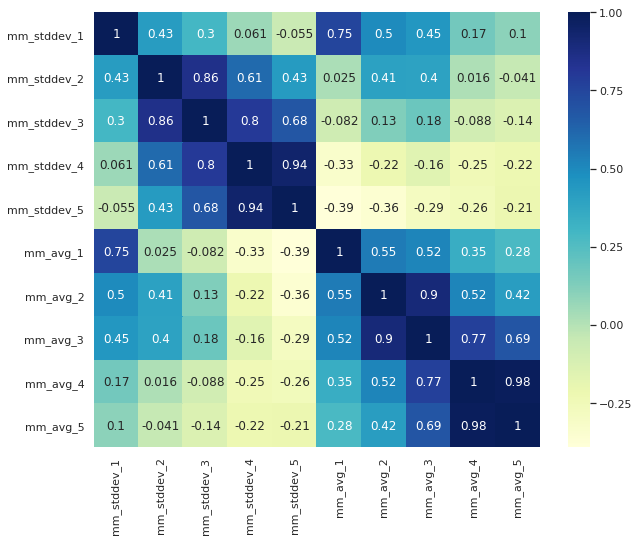

In [1036]:
# making a correlation heatmap

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_df, cmap="YlGnBu", annot=True) 
plt.show() 

We will consider a correlation higher than 0.85 to be strongly correlated.

1. `mm_avg_4` and `mm_avg_5` have a correlation of 0.98
2. `mm_stddev_4` and `mm_stddev_5` have a correlation of 0.94
3. `mm_avg_2` and `mm_avg_3` have a correlation of 0.90
4. `mm_stddev_2` and `mm_stddev_3` have a correlation of 0.86
5. `mm_stddev_3` and `mm_stddev_4` have a correlation of 0.80

In [1037]:
# dropping the columns mm_avg_4, mm_avg_2, and mm_stddev_4

columns_to_keep = [col for col in normalized_mm_df.columns if col not in ['mm_avg_4', 'mm_avg_2', 'mm_stddev_4', 'features', 'scaled_features']]
normalized_mm_df = normalized_mm_df.select(columns_to_keep)

normalized_mm_df.show()

+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+
|mm_stddev_1|mm_stddev_2|mm_stddev_3|mm_stddev_5|mm_avg_1|mm_avg_3| mm_avg_5|            track_id|
+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+
|     0.1545|      13.11|      840.0|  7108000.0|   0.319|  1371.0|8398000.0|'TRHFHQZ12903C9E2D5'|
|     0.1195|      13.02|      611.9|  7226000.0|  0.2661|  1829.0|  3.123E7|'TRHFHYX12903CAF953'|
|     0.2326|      7.185|      362.2|  3030000.0|  0.8854|  1384.0|9862000.0|'TRHFHAU128F9341A0E'|
|     0.2283|       10.3|      463.8|  3336000.0|  0.4321|  2047.0|  3.293E7|'TRHFHLP128F14947A7'|
|     0.1841|      8.544|      359.4|  3359000.0|  0.8438|  2008.0|  3.539E7|'TRHFHFF128F930AC11'|
|      0.146|      8.248|      519.4|  6138000.0|  0.2782|  1052.0|  2.293E7|'TRHFHYJ128F4234782'|
|    0.09586|      6.915|      409.9|  4691000.0|   0.213|  1140.0|  1.012E7|'TRHFHHR128F9339010'|
|      0.0

In [1038]:
# recalculating the 'features' and the 'scaled_features' columns so that they reflect this change
# running the same code as above

assembler2 = VectorAssembler(
    inputCols=[col for col in normalized_mm_df.columns if normalized_mm_df.schema[col].dataType == DoubleType()],
    outputCol="features"
)

assembled_mm_df2 = assembler2.transform(normalized_mm_df)
scaler2 = MinMaxScaler(inputCol="features", outputCol="scaled_features")
scaler_model2 = scaler.fit(assembled_mm_df2)
normalized_mm_df = scaler_model2.transform(assembled_mm_df2)
normalized_mm_df = normalized_mm_df.select(*assembled_mm_df2.columns, "scaled_features")

normalized_mm_df.show()

+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+--------------------+
|mm_stddev_1|mm_stddev_2|mm_stddev_3|mm_stddev_5|mm_avg_1|mm_avg_3| mm_avg_5|            track_id|            features|     scaled_features|
+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+--------------------+
|     0.1545|      13.11|      840.0|  7108000.0|   0.319|  1371.0|8398000.0|'TRHFHQZ12903C9E2D5'|[0.1545,13.11,840...|[0.16110531803962...|
|     0.1195|      13.02|      611.9|  7226000.0|  0.2661|  1829.0|  3.123E7|'TRHFHYX12903CAF953'|[0.1195,13.02,611...|[0.12460896767466...|
|     0.2326|      7.185|      362.2|  3030000.0|  0.8854|  1384.0|9862000.0|'TRHFHAU128F9341A0E'|[0.2326,7.185,362...|[0.24254431699687...|
|     0.2283|       10.3|      463.8|  3336000.0|  0.4321|  2047.0|  3.293E7|'TRHFHLP128F14947A7'|[0.2283,10.3,463....|[0.23806047966631...|
|     0.1841|

#### (b) Load the MSD All Music Genre Dataset (MAGD). Visualize the distribution of genres for the songs that were matched.


In [1039]:
magd_df.registerTempTable('magd')

genre_count_query = """
    SELECT genre, COUNT(track_id) as count, (COUNT(track_id) / SUM(COUNT(track_id)) OVER ()) as ratio
    FROM magd
    GROUP BY genre
    ORDER BY count DESC
"""

genre_count = spark.sql(genre_count_query)


In [593]:
show_as_html(genre_count)

,genre,count,ratio
0,Pop_Rock,238786,0.564888
1,Electronic,41075,0.097170
2,Rap,20939,0.049535
3,Jazz,17836,0.042194
4,Latin,17590,0.041612
5,RnB,14335,0.033912
6,International,14242,0.033692
7,Country,11772,0.027849
8,Religious,8814,0.020851
9,Reggae,6946,0.016432


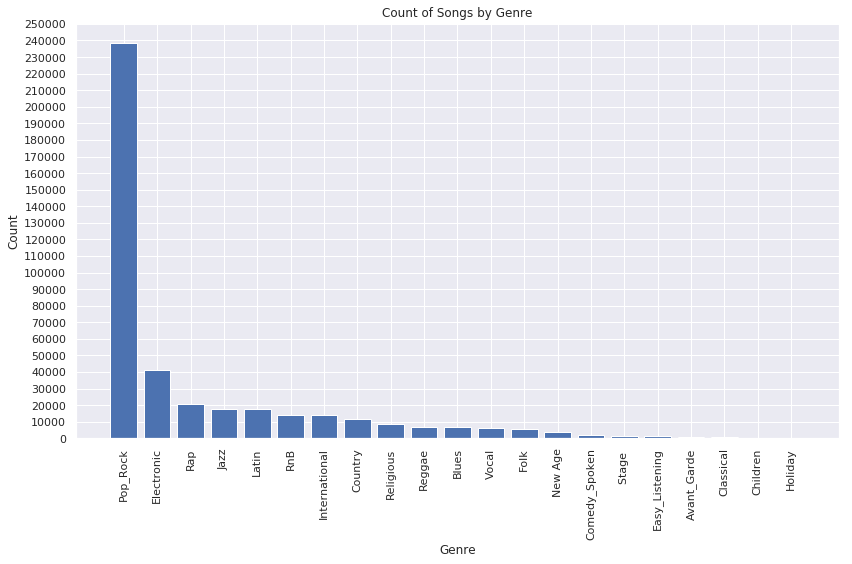

In [313]:
grouped_data_pd = genre_count.toPandas()

# Create a bar chart
plt.figure(figsize=(12, 8))
plt.bar(grouped_data_pd['genre'], grouped_data_pd['count'])
plt.xlabel('Genre')
plt.ylabel('Count')
plt.yticks(np.arange(0, 260000, step=10000))
plt.title('Count of Songs by Genre')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

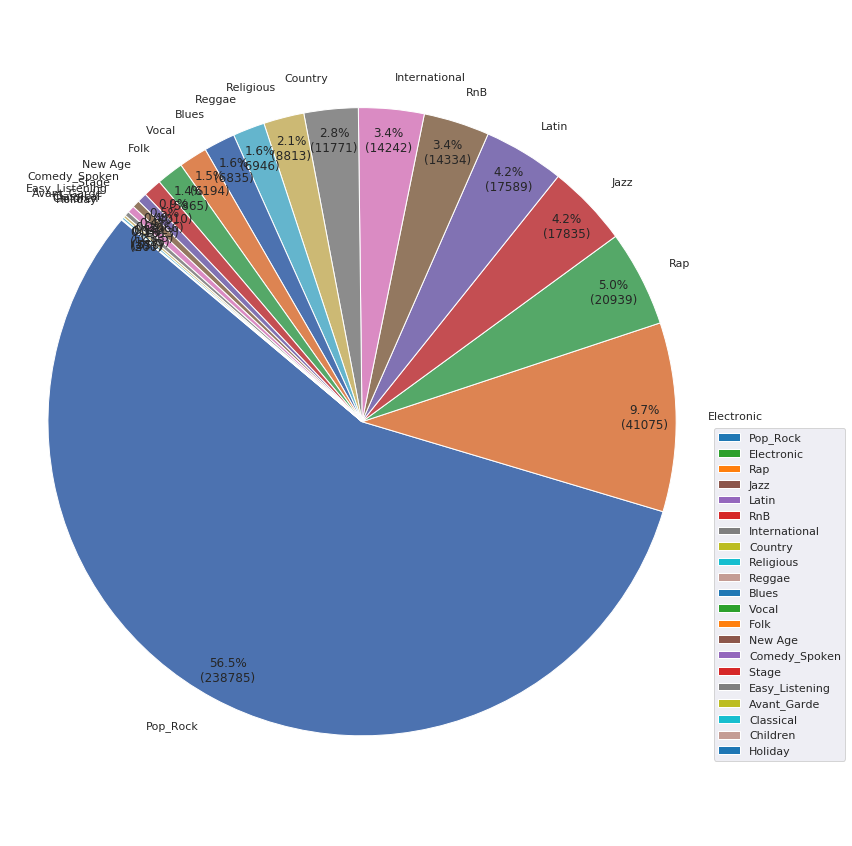

In [405]:
def autopct_format(pct):
    # Calculate the positions based on the percentage
    absolute = int(pct/100.*sum(grouped_data_pd['count']))
    return "{:.1f}%\n({:d})".format(pct, absolute)


plt.figure(figsize=(12,12))
plt.pie(grouped_data_pd['count'], labels=grouped_data_pd['genre'], autopct=autopct_format, startangle=140, pctdistance=0.90)
plt.legend(patches, grouped_data_pd['genre'], loc='best', bbox_to_anchor=(1, 0.5))
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.show()

#### (c) Merge the genres dataset and the audio features dataset so that every song has a label.

In [1040]:
normalized_mm_df.show(5)

+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+--------------------+
|mm_stddev_1|mm_stddev_2|mm_stddev_3|mm_stddev_5|mm_avg_1|mm_avg_3| mm_avg_5|            track_id|            features|     scaled_features|
+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+--------------------+
|     0.1545|      13.11|      840.0|  7108000.0|   0.319|  1371.0|8398000.0|'TRHFHQZ12903C9E2D5'|[0.1545,13.11,840...|[0.16110531803962...|
|     0.1195|      13.02|      611.9|  7226000.0|  0.2661|  1829.0|  3.123E7|'TRHFHYX12903CAF953'|[0.1195,13.02,611...|[0.12460896767466...|
|     0.2326|      7.185|      362.2|  3030000.0|  0.8854|  1384.0|9862000.0|'TRHFHAU128F9341A0E'|[0.2326,7.185,362...|[0.24254431699687...|
|     0.2283|       10.3|      463.8|  3336000.0|  0.4321|  2047.0|  3.293E7|'TRHFHLP128F14947A7'|[0.2283,10.3,463....|[0.23806047966631...|
|     0.1841|

In [1041]:
magd_df.show(5)

+------------------+--------+
|          track_id|   genre|
+------------------+--------+
|TRAAAAK128F9318786|Pop_Rock|
|TRAAAAV128F421A322|Pop_Rock|
|TRAAAAW128F429D538|     Rap|
|TRAAABD128F429CF47|Pop_Rock|
|TRAAACV128F423E09E|Pop_Rock|
+------------------+--------+
only showing top 5 rows



In [1042]:
# First, we can see that `mm_df` has quote marks around the track ID. We need to remove that in order to join the 2 datasets.

normalized_mm_df = normalized_mm_df.withColumn('track_id', F.regexp_replace('track_id', "'", ''))

In [1043]:
normalized_mm_df.show(5)

+-----------+-----------+-----------+-----------+--------+--------+---------+------------------+--------------------+--------------------+
|mm_stddev_1|mm_stddev_2|mm_stddev_3|mm_stddev_5|mm_avg_1|mm_avg_3| mm_avg_5|          track_id|            features|     scaled_features|
+-----------+-----------+-----------+-----------+--------+--------+---------+------------------+--------------------+--------------------+
|     0.1545|      13.11|      840.0|  7108000.0|   0.319|  1371.0|8398000.0|TRHFHQZ12903C9E2D5|[0.1545,13.11,840...|[0.16110531803962...|
|     0.1195|      13.02|      611.9|  7226000.0|  0.2661|  1829.0|  3.123E7|TRHFHYX12903CAF953|[0.1195,13.02,611...|[0.12460896767466...|
|     0.2326|      7.185|      362.2|  3030000.0|  0.8854|  1384.0|9862000.0|TRHFHAU128F9341A0E|[0.2326,7.185,362...|[0.24254431699687...|
|     0.2283|       10.3|      463.8|  3336000.0|  0.4321|  2047.0|  3.293E7|TRHFHLP128F14947A7|[0.2283,10.3,463....|[0.23806047966631...|
|     0.1841|      8.544|  

In [419]:
print(f"No. of rows in Methods of Moments audio-features dataset - {normalized_mm_df.count()}")
print(f"No. of rows in MAGD dataset - {magd_df.count()}")

print(f"Unique track IDs in Methods of Moments audio-features dataset- {normalized_mm_df.select('track_id').distinct().count()}")
print(f"Unique track IDs in MAGD dataset- {magd_df.select('track_id').distinct().count()}")

No. of rows in Methods of Moments audio-features dataset - 994623
No. of rows in MAGD dataset - 422714
Unique track IDs in Methods of Moments audio-features dataset- 994623
Unique track IDs in MAGD dataset- 422714


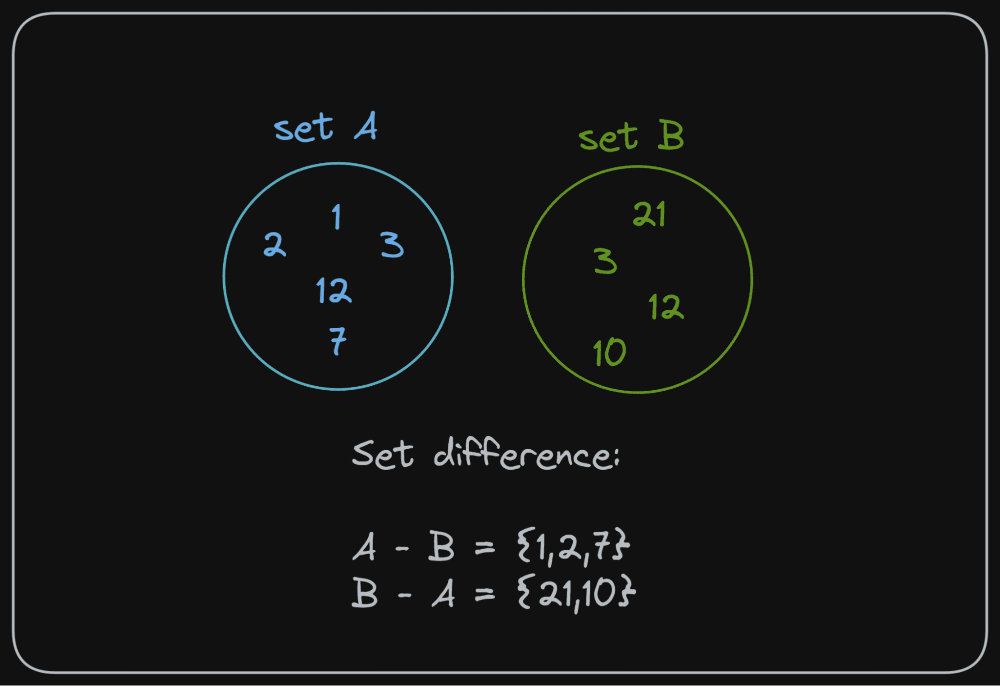

In [420]:
# we need to check how many track IDs are common in both datasets, and how many are absent from one but present in the other

unique_track_ids_magd = magd_df.select('track_id').distinct()
unique_track_ids_mm = normalized_mm_df.select('track_id').distinct()

# Compare the unique track IDs
intersection = unique_track_ids_magd.intersect(unique_track_ids_mm)
magd_minus_mm = unique_track_ids_magd.subtract(unique_track_ids_mm)
mm_minus_magd = unique_track_ids_mm.subtract(unique_track_ids_magd)


# Display the results
print(f"Number of common track IDs: {intersection.count()}")
print(f"Number of track IDs present in mm_df but missing in magd_df: {mm_minus_magd.count()}")
print(f"Number of track IDs present in magd_df but missing in mm_df: {magd_minus_mm.count()}")



Number of common track IDs: 420620
Number of track IDs present in mm_df but missing in magd_df: 574003
Number of track IDs present in magd_df but missing in mm_df: 2094


In [1044]:
# [!!!] the question says every song will have a label but how??

mm_and_genre_df = normalized_mm_df.join(magd_df, on = "track_id", how = "inner")

In [422]:
mm_and_genre_df.count()

420620

In [423]:
mm_and_genre_df.show()

+------------------+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+-------------+
|          track_id|mm_stddev_1|mm_stddev_2|mm_stddev_3|mm_stddev_5|mm_avg_1|mm_avg_3| mm_avg_5|            features|     scaled_features|        genre|
+------------------+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+-------------+
|TRAAABD128F429CF47|     0.1308|      9.587|      459.9|  4303000.0|  0.2474|  1067.0|8281000.0|[0.1308,9.587,459...|[0.13639207507820...|     Pop_Rock|
|TRAAHAU128F9313A3D|    0.08485|      9.031|      445.9|  3274000.0|  0.2583|  2015.0|  3.336E7|[0.08485,9.031,44...|[0.08847758081334...|     Pop_Rock|
|TRAAHZP12903CA25F4|     0.1654|      12.31|      565.1|  5273000.0|  0.1861|  1962.0|  3.355E7|[0.1654,12.31,565...|[0.17247132429614...|          Rap|
|TRAAICW128F1496C68|     0.1104|      7.123|      398.2|  3240000.0|  0.2871|  180

In [1045]:
# checking that every song has been assigned a genre

mm_and_genre_df.filter(col('genre').isNull()).count()

0

## Q2. Developing a binary classification model.

#### (a) Research and choose three classification algorithms from the` spark.ml` library. Justify your choice of algorithms, taking into account considerations such as explainability, interpretability, predictive accuracy, training speed, hyperparameter tuning, dimensionality, and issues with scaling.
#### Based on the descriptive statistics from Q1 part (a), decide what processing you should apply to the audio features before using them to train each model.

Algorithms that I will use here-

1. **Logistic Regression** - the simplest method of all.
2. **Random Forest** - because I want to do something related to trees.
3. **Neural Network** - I probably shouldn't use this because my theory part isn't very strong but I want to explore this.

For processing-
1. Initially, I joined the 2 datasets by using a left join. But that resulted in a lot of null values in the `genre` column of the merged dataframe, because `mm_df` and `magd_df` only share 420,620 tracks in common. This means that 574,003 tracks in the `mm_df` didn't have any 'genre' label on them when joined with `magd_df`. Since the task here is to build a classification model, we need labelled data because classification is a supervised learning method. Therefore, the data which doesn't have any label is not of any use to us. So I did an inner join so that the joined dataset would only include the tracks that were common in both the datasets, and we would get only labelled data.

2. Seeing the descriptive statistics and the correlation, I've normalized the data and dropped some columns, so the preprocessing is done.

3. Converting the 'genre' column to 0 and 1 where 1 is for "electronic" and 0 is for other.

#### (b) Convert the genre column into a binary column that represents if the song is ”Electronic” or some other genre. What is the class balance of the binary label?


In [1046]:

target_genre = 'Electronic'

# creating a new column 'is_electronic' based on the 'genre' column
mm_and_genre_df = mm_and_genre_df.withColumn('label', F.when(col('genre') == target_genre, 1).otherwise(0))

mm_and_genre_df.show()


+------------------+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+-------------+-----+
|          track_id|mm_stddev_1|mm_stddev_2|mm_stddev_3|mm_stddev_5|mm_avg_1|mm_avg_3| mm_avg_5|            features|     scaled_features|        genre|label|
+------------------+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+-------------+-----+
|TRAAABD128F429CF47|     0.1308|      9.587|      459.9|  4303000.0|  0.2474|  1067.0|8281000.0|[0.1308,9.587,459...|[0.13639207507820...|     Pop_Rock|    0|
|TRAAHAU128F9313A3D|    0.08485|      9.031|      445.9|  3274000.0|  0.2583|  2015.0|  3.336E7|[0.08485,9.031,44...|[0.08847758081334...|     Pop_Rock|    0|
|TRAAHZP12903CA25F4|     0.1654|      12.31|      565.1|  5273000.0|  0.1861|  1962.0|  3.355E7|[0.1654,12.31,565...|[0.17247132429614...|          Rap|    0|
|TRAAICW128F1496C68|     0.1104|      7.123|  

In [1047]:
# finding the class balance

def print_class_balance(data, name):

    total = data.count()
    counts = data.groupBy("label").count().toPandas()
    counts["ratio"] = counts["count"] / total

    print(f'dataset: {name}')
    print(f'total:   {total}\n')
    print(counts)
    print(f'')
    
print_class_balance(mm_and_genre_df, "mm_and_genre_df")

dataset: mm_and_genre_df
total:   420620

   label   count     ratio
0      0  379954  0.903319
1      1   40666  0.096681



#### (c) Split the dataset into training and test sets. You should use stratified random sampling to make sure the class balanced is preserved. You may also want to use a resampling method such as subsampling, oversampling, or observation weighting. Justify your overall approach and your choice of resampling method.

I can use the code from the CreditCardFraud notebook.

In [1048]:
# Exact stratification using Window (multi-class, counts computed on the fly)

temp = (
    mm_and_genre_df
    .withColumn("id", F.monotonically_increasing_id())
    .withColumn("random", F.rand())  # random number between 0 and 1
    .withColumn(
        "row",
        F.row_number()  # row number in each class partition (start at 0, 1, ... for positive and separately for negative)
        .over(
            Window
            .partitionBy("label")
            .orderBy("random")
        )
    )
)

# a dictionary for storing counts
counts = (
    mm_and_genre_df
    .groupBy("label")
    .count()
    .toPandas()
    .set_index("label")["count"]
    .to_dict()
)

# a list of class labels created from dictionary keys
labels = sorted(counts.keys())

print(counts)
print("")


# creating the training set
training = temp

# selecting the top 80% rows from each class.
# we have already the rows ordered randomly in each class
for label in labels:
    training = training.where((F.col("label") != label) | (F.col("row") < counts[label] * 0.8))

training.cache()

# creating the test set
test = temp.join(training, on="id", how="left_anti")
test.cache()

training = training.drop("id", "random", "row")
test = test.drop("id", "random", "row")



print_class_balance(mm_and_genre_df, "mm_and_genre_df")
print_class_balance(training, "training")
print_class_balance(test, "test")

{0: 379954, 1: 40666}

dataset: mm_and_genre_df
total:   420620

   label   count     ratio
0      0  379954  0.903319
1      1   40666  0.096681

dataset: training
total:   336495

   label   count     ratio
0      0  303963  0.903321
1      1   32532  0.096679

dataset: test
total:   84125

   label  count     ratio
0      0  75991  0.903311
1      1   8134  0.096689



In [1049]:
'''downsampling the training data to remove some rows of class 0
this is done by creating a column called 'random' which has random numbers from 0 to 1.
this column acts like an 'index'.
we keep only the rows for which the value in the 'random' column is less than 0.5
this removes 50% of the data from class 0.
'''

training_downsampled = (
    training
    .withColumn("random", F.rand())
    .where(
        ((F.col("label") == 1)) |
        ((F.col("label") == 0) & (F.col("random") < 0.5))
    )
)
training_downsampled.cache()

print_class_balance(training_downsampled, "training (downsampled)")

dataset: training (downsampled)
total:   184458

   label   count     ratio
0      0  151926  0.823635
1      1   32532  0.176365



#### (d) Train each of the three classification algorithms that you chose in part (a).

In [1052]:
# training the logistic regression model

lr = LogisticRegression(featuresCol='scaled_features', labelCol='label')
lr_model = lr.fit(training_downsampled)

In [1053]:
coefficients = lr_model.coefficients
intercept = lr_model.intercept

coefficients


DenseVector([5.4956, 5.3543, -0.1189, 5.889, -4.4459, -0.8446, 3.5528])

In [1054]:
# training the random forest model

rf = RandomForestClassifier(featuresCol='scaled_features', labelCol='label')
rf_model = rf.fit(training_downsampled)

In [1055]:
# the number of input features, or the number of neurons in the input layer, which is 7
input_features = len(training_downsampled.select('scaled_features').first()[0])

# number of neurons in the input, hidden, and output layers
layers = [input_features, 5, 2] 

# training the neural network
nn = MultilayerPerceptronClassifier(featuresCol='scaled_features', labelCol='label', layers=layers)
nn_model = nn.fit(training_downsampled)


#### (e)  Use the test set to compute the compute a range of performance metrics for each model, such as precision, accuracy, and recall.

Making predictions on the test set.

In [1056]:
def with_custom_prediction(pred, threshold, probabilityCol="probability", customPredictionCol="customPrediction"):
    """
    """

    apply_custom_threshold_udf = F.udf(lambda x: int(x[1] > threshold), IntegerType())

    return pred.withColumn(customPredictionCol, apply_custom_threshold_udf(F.col(probabilityCol)))


def print_metrics(pred, threshold=0.5, labelCol="label", predictionCol="prediction", rawPredictionCol="rawPrediction", probabilityCol="probability"):
    """
    """

    if threshold != 0.5:

        predictionCol = "customPrediction"
        pred = with_custom_prediction(pred, threshold, probabilityCol=probabilityCol, customPredictionCol=predictionCol)

    total = pred.count()

    nP_actual = pred.filter((F.col(labelCol) == 1)).count()
    nN_actual = pred.filter((F.col(labelCol) == 0)).count()

    nP_pred = pred.filter((F.col(predictionCol) == 1)).count()
    nN_pred = pred.filter((F.col(predictionCol) == 0)).count()
    TP = pred.filter((F.col(predictionCol) == 1) & (F.col(labelCol) == 1)).count()
    FP = pred.filter((F.col(predictionCol) == 1) & (F.col(labelCol) == 0)).count()
    FN = pred.filter((F.col(predictionCol) == 0) & (F.col(labelCol) == 1)).count()
    TN = pred.filter((F.col(predictionCol) == 0) & (F.col(labelCol) == 0)).count()

    if TP + FP > 0:
        precision = TP / (TP + FP)
    else:
        precision = 0
        
    recall = TP / (TP + FN)
    accuracy = (TP + TN) / total
     

    binary_evaluator = BinaryClassificationEvaluator(rawPredictionCol=rawPredictionCol, labelCol=labelCol, metricName='areaUnderROC')
    auroc = binary_evaluator.evaluate(pred)

    print(f'metrics for custom threshold')
    print(f'')
    print(f'threshold: {threshold}')
    print(f'')
    print(f'total:     {total}')
    print(f'')
    print(f'nP actual: {nP_actual}')
    print(f'nN actual: {nN_actual}')
    print(f'')
    print(f'nP pred:   {nP_pred}')
    print(f'nN pred:   {nN_pred}')
    print(f'')
    print(f'TP         {TP}')
    print(f'FP         {FP}')
    print(f'FN         {FN}')
    print(f'TN         {TN}')
    print(f'')
    print('Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)')
    print('Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)')
    print('Accuracy shows how often a classification ML model is correct overall.\n')
    print(f'precision:             {precision:.8f}')
    print(f'recall/sensitivity:    {recall:.8f}')
    print(f'accuracy:              {accuracy:.8f}')
    print(f'')
    print(f'auroc:                 {auroc:.8f}')
    print(f'')

In [1057]:
pred_lr = lr_model.transform(test)
pred_rf = rf_model.transform(test)
pred_nn = nn_model.transform(test)

In [1058]:
print_metrics(pred_lr)

metrics for custom threshold

threshold: 0.5

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   1113
nN pred:   83012

TP         414
FP         699
FN         7720
TN         75292

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.37196765
recall/sensitivity:    0.05089747
accuracy:              0.89992273

auroc:                 0.69449893



In [1059]:
print_metrics(pred_rf)

metrics for custom threshold

threshold: 0.5

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   1794
nN pred:   82331

TP         875
FP         919
FN         7259
TN         75072

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.48773690
recall/sensitivity:    0.10757315
accuracy:              0.90278752

auroc:                 0.75375570



In [1060]:
print_metrics(pred_nn)

metrics for custom threshold

threshold: 0.5

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   2284
nN pred:   81841

TP         896
FP         1388
FN         7238
TN         74603

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.39229422
recall/sensitivity:    0.11015491
accuracy:              0.89746211

auroc:                 0.74662351



##### Now I can try calculating my metrics according to different thresholds

In [1061]:
print_metrics(pred_lr, threshold = 0.3)

metrics for custom threshold

threshold: 0.3

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   8459
nN pred:   75666

TP         2305
FP         6154
FN         5829
TN         69837

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.27249084
recall/sensitivity:    0.28337841
accuracy:              0.85755721

auroc:                 0.69449208



In [1062]:
print_metrics(pred_rf, threshold = 0.3)

metrics for custom threshold

threshold: 0.3

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   6897
nN pred:   77228

TP         2562
FP         4335
FN         5572
TN         71656

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.37146585
recall/sensitivity:    0.31497418
accuracy:              0.88223477

auroc:                 0.75388110



In [1063]:
print_metrics(pred_nn, threshold = 0.3)

metrics for custom threshold

threshold: 0.3

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   13604
nN pred:   70521

TP         3644
FP         9960
FN         4490
TN         66031

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.26786239
recall/sensitivity:    0.44799607
accuracy:              0.82823180

auroc:                 0.74662381



In [1064]:
print_metrics(pred_lr, threshold = 0.7)

metrics for custom threshold

threshold: 0.7

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   193
nN pred:   83932

TP         43
FP         150
FN         8091
TN         75841

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.22279793
recall/sensitivity:    0.00528645
accuracy:              0.90203863

auroc:                 0.69449796



In [1065]:
print_metrics(pred_rf, threshold = 0.7)

metrics for custom threshold

threshold: 0.7

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   0
nN pred:   84125

TP         0
FP         0
FN         8134
TN         75991

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.00000000
recall/sensitivity:    0.00000000
accuracy:              0.90331055

auroc:                 0.75381129



In [1066]:
print_metrics(pred_nn, threshold = 0.7)

metrics for custom threshold

threshold: 0.7

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   102
nN pred:   84023

TP         33
FP         69
FN         8101
TN         75922

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.32352941
recall/sensitivity:    0.00405704
accuracy:              0.90288262

auroc:                 0.74662757



# Q3. 
#### (a) Look up the hyperparameters for each of your classification algorithms. Try to understand how these hyperparameters affect the performance of each model and think about if you would have chosen different hyperparameter values for Q2 part (d).

In [522]:
# this is a dictionary
lr_model.extractParamMap()

{Param(parent='LogisticRegression_5dd36d64e6fa', name='aggregationDepth', doc='suggested depth for treeAggregate (>= 2).'): 2,
 Param(parent='LogisticRegression_5dd36d64e6fa', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0,
 Param(parent='LogisticRegression_5dd36d64e6fa', name='family', doc='The name of family which is a description of the label distribution to be used in the model. Supported options: auto, binomial, multinomial'): 'auto',
 Param(parent='LogisticRegression_5dd36d64e6fa', name='featuresCol', doc='features column name.'): 'scaled_features',
 Param(parent='LogisticRegression_5dd36d64e6fa', name='fitIntercept', doc='whether to fit an intercept term.'): True,
 Param(parent='LogisticRegression_5dd36d64e6fa', name='labelCol', doc='label column name.'): 'label',
 Param(parent='LogisticRegression_5dd36d64e6fa', name='maxBlockSizeInMB', doc='maximum memory in M

In [528]:
rf_model.extractParamMap()

{Param(parent='RandomForestClassifier_92555c927d97', name='bootstrap', doc='Whether bootstrap samples are used when building trees.'): True,
 Param(parent='RandomForestClassifier_92555c927d97', name='cacheNodeIds', doc='If false, the algorithm will pass trees to executors to match instances with nodes. If true, the algorithm will cache node IDs for each instance. Caching can speed up training of deeper trees. Users can set how often should the cache be checkpointed or disable it by setting checkpointInterval.'): False,
 Param(parent='RandomForestClassifier_92555c927d97', name='checkpointInterval', doc='set checkpoint interval (>= 1) or disable checkpoint (-1). E.g. 10 means that the cache will get checkpointed every 10 iterations. Note: this setting will be ignored if the checkpoint directory is not set in the SparkContext.'): 10,
 Param(parent='RandomForestClassifier_92555c927d97', name='featureSubsetStrategy', doc="The number of features to consider for splits at each tree node. Supp

In [531]:
nn_model.extractParamMap()

{Param(parent='MultilayerPerceptronClassifier_84a4adb91ff6', name='blockSize', doc='block size for stacking input data in matrices. Data is stacked within partitions. If block size is more than remaining data in a partition then it is adjusted to the size of this data.'): 128,
 Param(parent='MultilayerPerceptronClassifier_84a4adb91ff6', name='featuresCol', doc='features column name.'): 'scaled_features',
 Param(parent='MultilayerPerceptronClassifier_84a4adb91ff6', name='labelCol', doc='label column name.'): 'label',
 Param(parent='MultilayerPerceptronClassifier_84a4adb91ff6', name='maxIter', doc='max number of iterations (>= 0).'): 100,
 Param(parent='MultilayerPerceptronClassifier_84a4adb91ff6', name='predictionCol', doc='prediction column name.'): 'prediction',
 Param(parent='MultilayerPerceptronClassifier_84a4adb91ff6', name='probabilityCol', doc='Column name for predicted class conditional probabilities. Note: Not all models output well-calibrated probability estimates! These proba

In [527]:
# now printing out the hyperparameter names and values

lr_hyperparameters = lr_model.extractParamMap()
for param, value in lr_hyperparameters.items():
    print(f"{param.name:{20}}: {value}")


aggregationDepth    : 2
elasticNetParam     : 0.0
family              : auto
featuresCol         : scaled_features
fitIntercept        : True
labelCol            : label
maxBlockSizeInMB    : 0.0
maxIter             : 100
predictionCol       : prediction
probabilityCol      : probability
rawPredictionCol    : rawPrediction
regParam            : 0.0
standardization     : True
threshold           : 0.5
tol                 : 1e-06


In [530]:
rf_hyperparameters = rf_model.extractParamMap()
for param, value in rf_hyperparameters.items():
    print(f"{param.name:{25}}: {value}")


bootstrap                : True
cacheNodeIds             : False
checkpointInterval       : 10
featureSubsetStrategy    : auto
featuresCol              : scaled_features
impurity                 : gini
labelCol                 : label
leafCol                  : 
maxBins                  : 32
maxDepth                 : 5
maxMemoryInMB            : 256
minInfoGain              : 0.0
minInstancesPerNode      : 1
minWeightFractionPerNode : 0.0
numTrees                 : 20
predictionCol            : prediction
probabilityCol           : probability
rawPredictionCol         : rawPrediction
seed                     : -9091904424264398198
subsamplingRate          : 1.0


In [534]:
nn_hyperparameters = nn_model.extractParamMap()
for param, value in nn_hyperparameters.items():
    print(f"{param.name:{20}}: {value}")


blockSize           : 128
featuresCol         : scaled_features
labelCol            : label
maxIter             : 100
predictionCol       : prediction
probabilityCol      : probability
rawPredictionCol    : rawPrediction
seed                : -4323701647951274898
solver              : l-bfgs
stepSize            : 0.03
tol                 : 1e-06
layers              : [7, 5, 2]


# Q4. 

#### (a) Choose one of your algorithms from Q2 that is capable of multiclass classification and describe how it can predict one class out of multiple classes.

I'm choosing random forest. Will write about it in the report.

#### (b) Convert the genre column into an integer index that encodes each genre consistently. Find a way to do this that requires the least amount of work by hand.

In [607]:
mm_and_genre_df.show()

+------------------+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+-------------+
|          track_id|mm_stddev_1|mm_stddev_2|mm_stddev_3|mm_stddev_5|mm_avg_1|mm_avg_3| mm_avg_5|            features|     scaled_features|        genre|
+------------------+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+-------------+
|TRAAABD128F429CF47|     0.1308|      9.587|      459.9|  4303000.0|  0.2474|  1067.0|8281000.0|[0.1308,9.587,459...|[0.13639207507820...|     Pop_Rock|
|TRAAHAU128F9313A3D|    0.08485|      9.031|      445.9|  3274000.0|  0.2583|  2015.0|  3.336E7|[0.08485,9.031,44...|[0.08847758081334...|     Pop_Rock|
|TRAAHZP12903CA25F4|     0.1654|      12.31|      565.1|  5273000.0|  0.1861|  1962.0|  3.355E7|[0.1654,12.31,565...|[0.17247132429614...|          Rap|
|TRAAICW128F1496C68|     0.1104|      7.123|      398.2|  3240000.0|  0.2871|  180

In [608]:
# copying the data into a new variable because i want to avoid any variable mixup with the previous code

data_for_multiclass = mm_and_genre_df

In [ ]:
data_for_multiclass.drop("label")

In [609]:
# creating a StringIndexer to index the 'genre' column
indexer = StringIndexer(inputCol="genre", outputCol="genre_index")

# Fit and transform the DataFrame to add a new column "genre_index"
data_for_multiclass = indexer.fit(data_for_multiclass).transform(data_for_multiclass)

data_for_multiclass.show()


+------------------+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+-------------+-----------+
|          track_id|mm_stddev_1|mm_stddev_2|mm_stddev_3|mm_stddev_5|mm_avg_1|mm_avg_3| mm_avg_5|            features|     scaled_features|        genre|genre_index|
+------------------+-----------+-----------+-----------+-----------+--------+--------+---------+--------------------+--------------------+-------------+-----------+
|TRAAABD128F429CF47|     0.1308|      9.587|      459.9|  4303000.0|  0.2474|  1067.0|8281000.0|[0.1308,9.587,459...|[0.13639207507820...|     Pop_Rock|        0.0|
|TRAAHAU128F9313A3D|    0.08485|      9.031|      445.9|  3274000.0|  0.2583|  2015.0|  3.336E7|[0.08485,9.031,44...|[0.08847758081334...|     Pop_Rock|        0.0|
|TRAAHZP12903CA25F4|     0.1654|      12.31|      565.1|  5273000.0|  0.1861|  1962.0|  3.355E7|[0.1654,12.31,565...|[0.17247132429614...|          Rap|        2.0|
|TRAAICW12

#### (c) Split your dataset into training and test sets, train the classification algorithm that you chose in part (b), and compute a range of performance metrics that are relevant to multiclass classification. Make sure you take into account the class balance in your comments.

#### How has the performance of your model been affected by the inclusion of multiple genres?

In [610]:
data_for_multiclass.count()

420620

In [672]:
# Exact stratification using Window (multi-class, counts computed on the fly)


# creating some new columns and storing this new table in 'temp'
temp = (
    data_for_multiclass
    .withColumn("id", F.monotonically_increasing_id())
    .withColumn("random", F.rand())  # random number between 0 and 1
    .withColumn(
        "row",
        F.row_number()  # row number in each class partition (start at 0, 1, ... for positive and separately for negative)
        .over(
            Window
            .partitionBy("genre_index")
            .orderBy("random")
        )
    )
)

# a dictionary for storing counts
counts_mc = (
    data_for_multiclass
    .groupBy("genre_index")
    .count()
    .toPandas()
    .set_index("genre_index")["count"]
    .to_dict()
)


# a list of class labels created from dictionary keys
labels_mc = sorted(counts_mc.keys())

print('counts_mc dictionary:')
print(counts_mc)


# creating the training data
# selecting the top 80% rows from each class.
# we already have the rows ordered randomly in each class

train_mc = temp

for label in labels_mc:
    train_mc = train_mc.where((F.col("genre_index") != label) | (F.col("row") < counts_mc[label] * 0.8))

train_mc.cache()


#creating test data
test_mc = temp.join(train_mc, on="id", how="left_anti")
test_mc.cache()

train_mc = train_mc.drop("id", "random", "row")
test_mc = test_mc.drop("id", "random", "row")



counts_mc dictionary:
{13.0: 4000, 19.0: 463, 20.0: 200, 3.0: 17775, 12.0: 5789, 8.0: 8780, 15.0: 1613, 6.0: 14194, 16.0: 1535, 7.0: 11691, 9.0: 6931, 18.0: 555, 11.0: 6182, 1.0: 40666, 5.0: 14314, 0.0: 237649, 2.0: 20899, 4.0: 17504, 10.0: 6801, 17.0: 1012, 14.0: 2067}


In [673]:
print(f'Rows in (multiclass) train data:  {train_mc.count()}')
print(f'Rows in (multiclass) test data:   {test_mc.count()}')

Rows in (multiclass) train data:  336483
Rows in (multiclass) test data:   84137


In [741]:
def print_multiclass_balance(data, name):

    total = data.count()
    counts = data.groupBy("genre","genre_index").count()
    counts = counts.orderBy("count", ascending=False)
    counts = counts.withColumn("ratio", col("count") / total)
    
    print(f'dataset: {name}')
    print(f'total:   {total}\n')
    show_as_html(counts,30)
    print(f'')


In [743]:
# find class balance and ratios for full data

print_multiclass_balance(data_for_multiclass, "data_for_multiclass")

dataset: data_for_multiclass
total:   420620



,genre,genre_index,count,ratio
0,Pop_Rock,0.0,237649,0.564997
1,Electronic,1.0,40666,0.096681
2,Rap,2.0,20899,0.049686
3,Jazz,3.0,17775,0.042259
4,Latin,4.0,17504,0.041615
5,RnB,5.0,14314,0.034031
6,International,6.0,14194,0.033745
7,Country,7.0,11691,0.027795
8,Religious,8.0,8780,0.020874
9,Reggae,9.0,6931,0.016478


In [744]:
# find class balance and ratios for test

print_multiclass_balance(test_mc, "test_mc")

dataset: test_mc
total:   84137



,genre,genre_index,count,ratio
0,Pop_Rock,0.0,47530,0.564912
1,Electronic,1.0,8134,0.096676
2,Rap,2.0,4180,0.049681
3,Jazz,3.0,3556,0.042264
4,Latin,4.0,3501,0.041611
5,RnB,5.0,2863,0.034028
6,International,6.0,2839,0.033743
7,Country,7.0,2339,0.027800
8,Religious,8.0,1757,0.020883
9,Reggae,9.0,1387,0.016485


In [742]:
# find class balance and ratios for train

print_multiclass_balance(train_mc, "train_mc")

dataset: train_mc
total:   336483



,genre,genre_index,count,ratio
0,Pop_Rock,0.0,190119,0.565018
1,Electronic,1.0,32532,0.096682
2,Rap,2.0,16719,0.049688
3,Jazz,3.0,14219,0.042258
4,Latin,4.0,14003,0.041616
5,RnB,5.0,11451,0.034031
6,International,6.0,11355,0.033746
7,Country,7.0,9352,0.027793
8,Religious,8.0,7023,0.020872
9,Reggae,9.0,5544,0.016476


In [745]:
# training the random forest on imbalanced train data

rf_mc_imbalanced = RandomForestClassifier(featuresCol='scaled_features', labelCol='genre_index', maxDepth=15)
rf_mc_imbalanced_model = rf_mc_imbalanced.fit(train_mc)

In [746]:
pred_rf_mc_imbalanced = rf_mc_imbalanced_model.transform(test_mc)

In [747]:
evaluator = MulticlassClassificationEvaluator(
    labelCol="genre_index",  # Actual class labels column
    predictionCol= 'prediction'  # Predicted class labels column
)

# Calculate and print the F1-Score
f1_score = evaluator.evaluate(pred_rf_mc_imbalanced)
weighted_precision = evaluator.setMetricName("weightedPrecision").evaluate(pred_rf_mc_imbalanced)
weighted_recall = evaluator.setMetricName("weightedRecall").evaluate(pred_rf_mc_imbalanced)
accuracy = evaluator.setMetricName("accuracy").evaluate(pred_rf_mc_imbalanced)

print('PERFORMANCE OF RANDOM FOREST WHEN TRAINED ON IMBALANCED DATA\n\n')
print('Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)')
print('Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)')
print('Accuracy shows how often a classification ML model is correct overall.\n')
print(f'weighted precision:             {weighted_precision:.8f}')
print(f'weighted recall/sensitivity:    {weighted_recall:.8f}')
print(f'accuracy:                       {accuracy:.8f}')
print(f'F-1 score:                      {f1_score:.8f}')

PERFORMANCE OF RANDOM FOREST WHEN TRAINED ON IMBALANCED DATA


Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

weighted precision:             0.49968375
weighted recall/sensitivity:    0.58781511
accuracy:                       0.58781511
F-1 score:                      0.47992713


These scores are not very good, so I will try resampling using the function that was given to us and see if it improves the performance.

In [705]:
'''
The function looks at each row. 
If the count for the genre in that row is below the lower bound, it upsamples. 
It randomly duplicates that row using poisson distribution.
I don't understand what the code is doing.
x is the genre_index.
y is the 'rand' column
counts_mc is a dictionary that was defined above.
'''
counts_train_mc = (
    train_mc
    .groupBy("genre_index")
    .count()
    .toPandas()
    .set_index("genre_index")["count"]
    .to_dict()
)

# Upsampling via poisson random sampling

# bounds will determine when upsampling or downsampling should occur
count_lower_bound = 2000
count_upper_bound = 50000

def random_resample(x, y, counts_train_mc, count_lower_bound, count_upper_bound):

    count = counts_train_mc[x]
    print(f'count of x {counts}, {counts_train_mc[x]}')
    if count < count_lower_bound:
        return [1] * int(1 + np.random.poisson((count_lower_bound - count) / count))  # randomly upsample to count_lower_bound

    if count > count_upper_bound:
        if y < (count_upper_bound / count): # randomly downsample to count_upper_bound
            return [1]
        else:
            return []

    return [1]  # do nothing


random_resample_udf = F.udf(
    lambda x, y: random_resample(x, y, counts_train_mc, count_lower_bound, count_upper_bound),
    ArrayType(IntegerType())
)



In [722]:
# resampling the train_mc dataset
seed=42
train_mc_resampled = (
    train_mc
    .withColumn("rand", F.rand(seed))
    .withColumn("sample", random_resample_udf(F.col("genre_index"), F.col("rand"))) # x, y inputs
    .select(
        F.col("track_id"),
        F.col("genre"),
        F.col("genre_index"),
        F.col("features"),
        F.col("scaled_features"),
        F.explode(F.col("sample")).alias("sample")  # note that explode on [] will effectively drop the row
    )
    .drop("sample")
)


In [748]:
# looking at the class balance of resampld data

print_multiclass_balance(train_mc_resampled, "train_mc_resampled")

dataset: train_mc_resampled
total:   204718



,genre,genre_index,count,ratio
0,Pop_Rock,0.0,50240,0.245411
1,Electronic,1.0,32532,0.158911
2,Rap,2.0,16719,0.081668
3,Jazz,3.0,14219,0.069457
4,Latin,4.0,14003,0.068401
5,RnB,5.0,11451,0.055935
6,International,6.0,11355,0.055467
7,Country,7.0,9352,0.045682
8,Religious,8.0,7023,0.034306
9,Reggae,9.0,5544,0.027081


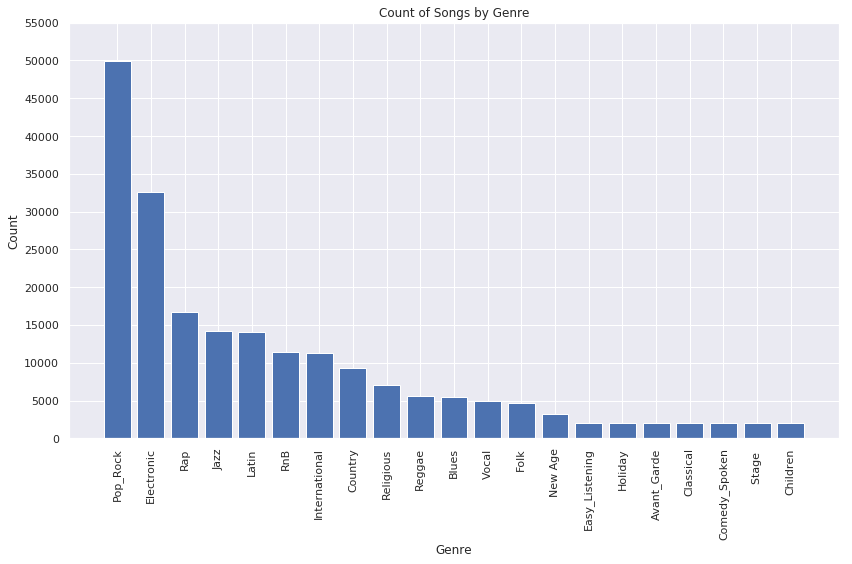

In [716]:
# visualizing the class distribution in resampled training data

train_mc_resampled_count_pd = train_mc_resampled_count.toPandas()


plt.figure(figsize=(12, 8))
plt.bar(train_mc_resampled_count_pd['genre'], train_mc_resampled_count_pd['count'])
plt.xlabel('Genre')
plt.ylabel('Count')
plt.yticks(np.arange(0, 60000, step=5000))
plt.title('Count of Songs by Genre')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [750]:
# training the random forest on resampled train data

rf_mc_resampled = RandomForestClassifier(featuresCol='scaled_features', labelCol='genre_index', maxDepth=15)
rf_mc_resampled_model = rf_mc_resampled.fit(train_mc_resampled)

In [751]:
pred_rf_mc_resampled = rf_mc_resampled_model.transform(test_mc)

In [752]:
evaluator = MulticlassClassificationEvaluator(
    labelCol="genre_index",  # Actual class labels column
    predictionCol= 'prediction'  # Predicted class labels column
)

# Calculate and print the F1-Score
f1_score = evaluator.evaluate(pred_rf_mc_resampled)
weighted_precision = evaluator.setMetricName("weightedPrecision").evaluate(pred_rf_mc_resampled)
weighted_recall = evaluator.setMetricName("weightedRecall").evaluate(pred_rf_mc_resampled)
accuracy = evaluator.setMetricName("accuracy").evaluate(pred_rf_mc_resampled)

print('PERFORMANCE OF RANDOM FOREST WHEN TRAINED ON RESAMPLED DATA\n\n')
print('Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)')
print('Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)')
print('Accuracy shows how often a classification ML model is correct overall.\n')
print(f'weighted precision:             {weighted_precision:.8f}')
print(f'weighted recall/sensitivity:    {weighted_recall:.8f}')
print(f'accuracy:                       {accuracy:.8f}')
print(f'F-1 score:                      {f1_score:.8f}')

PERFORMANCE OF RANDOM FOREST WHEN TRAINED ON RESAMPLED DATA


Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

weighted precision:             0.48177641
weighted recall/sensitivity:    0.52502466
accuracy:                       0.52502466
F-1 score:                      0.49023290


In [755]:
# comparing the performance on binary data

rf_bc = RandomForestClassifier(featuresCol='scaled_features', labelCol='label', maxDepth = 15)
rf_bc_model = rf_bc.fit(training_downsampled)

In [756]:
# looking at the metrics of the binary classifier

pred_rf_bc = rf_bc_model.transform(test)

print_metrics(pred_rf_bc)

metrics for custom threshold

threshold: 0.5

total:     84125

nP actual: 8134
nN actual: 75991

nP pred:   4907
nN pred:   79218

TP         2394
FP         2513
FN         5740
TN         73478

Precision: how often the positive predictions are correct? (correct positive predictions / all positive predictions)
Recall: can an ML model find all instances of the positive class? (correct positive predictions / actual positives)
Accuracy shows how often a classification ML model is correct overall.

precision:             0.48787447
recall/sensitivity:    0.29432014
accuracy:              0.90189599

auroc:                 0.81356527



# SONG RECOMMENDATIONS

#### First it will be helpful to know more about the properties of the dataset before you being training the collaborative filtering model.

#### (a) Based on the size, format, and number of rows, do you think you should repartition and cache the Taste Profile dataset to improve efficiency when training a collaborative filtering model?

In [763]:
triplets_df.show(10)

+--------------------+------------------+-----------+
|             user_id|           song_id|play_counts|
+--------------------+------------------+-----------+
|f1bfc2a4597a3642f...|SOQEFDN12AB017C52B|          1|
|f1bfc2a4597a3642f...|SOQOIUJ12A6701DAA7|          2|
|f1bfc2a4597a3642f...|SOQOKKD12A6701F92E|          4|
|f1bfc2a4597a3642f...|SOSDVHO12AB01882C7|          1|
|f1bfc2a4597a3642f...|SOSKICX12A6701F932|          1|
|f1bfc2a4597a3642f...|SOSNUPV12A8C13939B|          1|
|f1bfc2a4597a3642f...|SOSVMII12A6701F92D|          1|
|f1bfc2a4597a3642f...|SOTUNHI12B0B80AFE2|          1|
|f1bfc2a4597a3642f...|SOTXLTZ12AB017C535|          1|
|f1bfc2a4597a3642f...|SOTZDDX12A6701F935|          1|
+--------------------+------------------+-----------+
only showing top 10 rows



In [888]:
triplets_df.describe().toPandas()

,summary,user_id,song_id,play_counts,rand
0,count,48373586,48373586,48373586,48373586
1,mean,None,None,2.866858847305635,0.5000576304254728
2,stddev,None,None,6.4377246868772176,0.28867980387287706
3,min,00000b722001882066dff9d2da8a775658053ea0,SOAAADD12AB018A9DD,1,4.740214443188506E-9
4,max,fffff9534445f481b6ab91c345500083d2ce4df1,SOZZZWN12AF72A1E29,995,0.9999999767896194


In [764]:
# Determine ideal number of partitions

conf = sc.getConf()

N = int(conf.get("spark.executor.instances"))
M = int(conf.get("spark.executor.cores"))
partitions = 4 * N * M

print(f'ideal # partitions = {partitions}')

ideal # partitions = 96


In [766]:
triplets_df.repartition(partitions)
triplets_df.cache()

DataFrame[user_id: string, song_id: string, play_counts: string]

#### (b) How many unique songs are there in the dataset? How many unique users?

In [784]:
# unique songs
unique_songs = triplets_df.select('song_id').distinct().count()
print(f"Unique songs in triplets - {unique_songs}")

Unique songs in triplets - 384546


In [788]:
# unique users
unique_users = triplets_df.select('user_id').distinct().count()
print(f"Unique users in triplets - {unique_users}")

Unique users in triplets - 1019318


#### (c) How many different songs has the most active user played?

#### What is this as a percentage of the total number of unique songs in the dataset?

In [886]:
# finding the user with the most distinct number of songs


# grouping by 'user_id' and counting the distinct 'song_id' for each user

user_song_counts = (triplets_df
                    .groupBy("user_id")
                    .agg(F.countDistinct("song_id")
                         .alias("distinct_song_count"))
                   .orderBy("distinct_song_count", ascending = False))


top_user = user_song_counts.first()

print(top_user)

Row(user_id='ec6dfcf19485cb011e0b22637075037aae34cf26', distinct_song_count=4400)


In [887]:
print(f" Most active user's different songs as a percentage of the total number of unique songs in the dataset - {(4400/unique_songs)*100:.4f}%")

 Most active user's different songs as a percentage of the total number of unique songs in the dataset - 1.1442%


In [778]:
# finding the user with the highest total play counts

user_play_counts = (triplets_df
                    .groupBy("user_id")
                    .agg(F.sum("play_counts")
                         .alias("total_play_counts"))
                   .orderBy(F.desc("total_play_counts")))

show_as_html(user_play_counts,10)


,user_id,total_play_counts
0,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,13132.0
1,119b7c88d58d0c6eb051365c103da5caf817bea6,9884.0
2,3fa44653315697f42410a30cb766a4eb102080bb,8210.0
3,a2679496cd0af9779a92a13ff7c6af5c81ea8c7b,7015.0
4,d7d2d888ae04d16e994d6964214a1de81392ee04,6494.0
5,4ae01afa8f2430ea0704d502bc7b57fb52164882,6472.0
6,b7c24f770be6b802805ac0e2106624a517643c17,6150.0
7,113255a012b2affeab62607563d03fbdf31b08e7,5656.0
8,6d625c6557df84b60d90426c0116138b617b9449,5620.0
9,99ac3d883681e21ea68071019dba828ce76fe94d,5602.0


In [882]:
# extracting information of the most active user

most_active_user = user_play_counts.first()
most_active_user_id = most_active_user["user_id"]

# now finding songs of the most active user

most_active_user_songs = triplets_df.filter(triplets_df["user_id"] == most_active_user_id)
distinct_song_count = most_active_user_songs.select("song_id").distinct().count()

print(f"The most active user (user_id: {most_active_user_id}) has played {distinct_song_count} different songs.")

The most active user (user_id: 093cb74eb3c517c5179ae24caf0ebec51b24d2a2) has played 202 different songs.


In [787]:
print(f" Most active user's different songs as a percentage of the total number of unique songs in the dataset - {(distinct_song_count/unique_songs)*100:.4f}%")

 Most active user's different songs as a percentage of the total number of unique songs in the dataset - 0.0525%


In [866]:
show_as_html(most_active_user_songs, 9)

,user_id,song_id,play_counts
0,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,SOAAXEQ12A6D4F7B4C,20
1,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,SOABHYV12A6D4F6D0F,11
2,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,SOAFFKC12AB0187741,6
3,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,SOAHVLJ12A58A76DD6,3
4,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,SOAJDBZ12A6D4FA3C8,62
5,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,SOAJVOL12AAF3B25E6,10
6,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,SOAMEVJ12A6701E393,2
7,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,SOAONVU12A6D4F4759,38
8,093cb74eb3c517c5179ae24caf0ebec51b24d2a2,SOAOSDF12A58A779F1,9667


In [865]:
# now finding songs of the most active user

triplets_df.filter((triplets_df["user_id"] == most_active_user_id) & (triplets_df["song_id"] == "SOAOSDF12A58A779F1")).show()


+--------------------+------------------+-----------+
|             user_id|           song_id|play_counts|
+--------------------+------------------+-----------+
|093cb74eb3c517c51...|SOAOSDF12A58A779F1|       9667|
+--------------------+------------------+-----------+



In [889]:
'''I want to see the songs with highest play counts because I think 9667 is an 
outlier. I want to see the gap between this song and the next most-played song.
'''
(triplets_df.orderBy(F.desc("play_counts"))).show(10)

+--------------------+------------------+-----------+-------------------+
|             user_id|           song_id|play_counts|               rand|
+--------------------+------------------+-----------+-------------------+
|9d5c5b028adbf0815...|SOKJKUJ12AF72A3618|        995| 0.4396575479401914|
|f2b3224c1a5b5ef73...|SOICKOC12A6701C603|         99|0.02645195736015704|
|17c971a2e36d2f348...|SOYYJMW12A6D4F8636|         99| 0.8415894064970484|
|db8bfc5305d80d507...|SOPQSMO12A8C13F670|         99|   0.23733191705447|
|f9288b1f39363a5fd...|SOMDOBH12A6D4F978E|         99| 0.7704077227875471|
|dd1592c0e1661564e...|SOWGCMN12A8C136E44|         99|0.06474333657594133|
|d2a355c4526bdf4b0...|SOBOUPA12A6D4F81F1|         99|0.03804596991087561|
|d0b8be85555fa4105...|SOFGDGA12AB017C86B|         99|0.20837829059472057|
|4ab043941a94f86c1...|SOPSOHT12A67AE0235|         99| 0.3087004007036528|
|dbf4d3f0e6a952bc8...|SOVHFMK12A679AE565|         99| 0.8858085805131304|
+--------------------+----------------

In [892]:
# it's best to drop this weird row

user_id_to_remove = "093cb74eb3c517c5179ae24caf0ebec51b24d2a2"
song_id_to_remove = "SOAOSDF12A58A779F1"

triplets_df = triplets_df.filter(
    (col("user_id") != user_id_to_remove) | (col("song_id") != song_id_to_remove)
)


#### (d) Visualize the distribution of song popularity and the distribution of user activity by collecting the counts of user plays per song and the counts of song plays per user respectively, and describe the shape of the distributions.

Text(0,0.5,'No. of Songs')

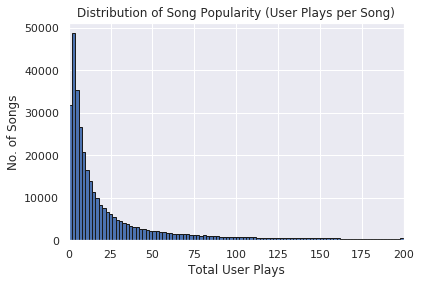

In [914]:
# visualizing song popularity


song_play_counts = (triplets_df
                    .groupBy("song_id")
                    .agg(F.count("play_counts").alias("user_play_count")))   


song_play_counts_pd = song_play_counts.toPandas()

num_bins = 100
bin_range = (0, 200)


plt.hist(song_play_counts_pd["user_play_count"], bins=num_bins, range=bin_range, edgecolor='k')
plt.title("Distribution of Song Popularity (User Plays per Song)")
plt.xlim(0, 200)
plt.xlabel("Total User Plays")
plt.ylabel("No. of Songs")

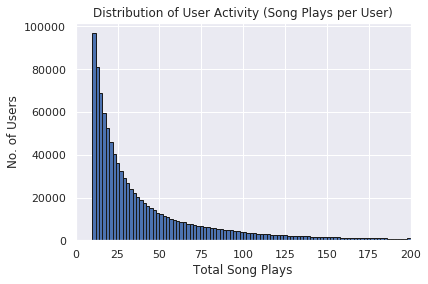

In [913]:
# visualizing user activity

user_song_counts = (triplets_df
                    .groupBy("user_id")
                    .agg(F.count("play_counts").alias("song_play_count")))

user_song_counts_pd = user_song_counts.toPandas()

num_bins = 100
bin_range = (0, 200)

plt.hist(user_song_counts_pd["song_play_count"], bins=num_bins, range=bin_range, edgecolor='k')
plt.title("Distribution of User Activity (Song Plays per User)")
plt.xlim(0, 200)
plt.xlabel("Total Song Plays")
plt.ylabel("No. of Users")

plt.show()

# Q2. 

#### (a) Collaborative filtering determines similar users and songs based on their combined play history. Songs which have been played only a few times and users who have only listened to a few songs will not contribute much information and are unlikely to improve the model.

#### Create a clean dataset of user-song plays by removing songs which have been played less than N times and users who have listened to fewer than M songs in total. Choose sensible values for N and M, taking into account the total number of users and songs.

In [893]:
# calculating some descriptive stats to decide values for M and N

songs_per_user = (triplets_df
                      .groupBy("user_id")
                      .agg(F.countDistinct("song_id")
                           .alias("songs_per_user")))

avg_songs_per_user = (songs_per_user
                      .select(F.mean("songs_per_user"))
                      .collect()[0][0])

print(f"How many songs does a user listen to on average? - {avg_songs_per_user}")

How many songs does a user listen to on average? - 47.45681426208504


In [894]:
# calculating some descriptive stats to decide values for M and N

listeners_per_song = (triplets_df
                          .groupBy("song_id")
                          .agg(F.countDistinct("user_id")
                               .alias("listeners_per_song")))

avg_listeners_per_song = (listeners_per_song
                      .select(F.mean("listeners_per_song"))
                      .collect()[0][0])
                          
print(f"How many listeners does a song have on average? - {avg_listeners_per_song}")               

How many listeners does a song have on average? - 125.79401424016892


In [895]:
# calculating some descriptive stats to decide values for M and N

plays_per_song = (triplets_df
                  .groupBy("song_id")
                  .agg(F.sum("play_counts")
                       .alias("plays_per_song")))

avg_plays_per_song = (plays_per_song
                      .select(F.mean("plays_per_song"))
                      .collect()[0][0])

print(f"How many times is a song played on average? - {avg_plays_per_song}")

How many times is a song played on average? - 360.6085513826694


In [896]:
plays_per_user = (triplets_df
                  .groupBy("user_id")
                  .agg(F.sum("play_counts")
                       .alias("plays_per_user")))

avg_plays_per_song = (plays_per_user
                      .select(F.mean("plays_per_user"))
                      .collect()[0][0])

print(f"How many times does a user play any song on average? - {avg_plays_per_song}")

How many times does a user play any song on average? - 136.04250685262107


In [971]:
# Define the thresholds for play counts (N) and user activity (M)
N = 100  # Minimum number of plays per song
M = 20  # Minimum number of songs per user

# Filter songs based on play counts
filtered_songs = triplets_df.groupBy("song_id").agg(F.count("user_id").alias("play_count"))
filtered_songs = filtered_songs.filter(filtered_songs["play_count"] >= N)

# Filter users based on activity
filtered_users = triplets_df.groupBy("user_id").agg(F.countDistinct("song_id").alias("song_count"))
filtered_users = filtered_users.filter(filtered_users["song_count"] >= M)

# Join the filtered songs and users back with the original triplets_df
cleaned_triplets_df = triplets_df.join(filtered_songs, "song_id", "inner").join(filtered_users, "user_id", "inner")




In [972]:
columns_to_drop = ["play_count", "song_count"]
cleaned_triplets_df = cleaned_triplets_df.drop(*columns_to_drop)


In [919]:
cleaned_triplets_df.count()

38158181

In [963]:
cleaned_triplets_df.show()

+--------------------+------------------+-----------+--------------------+
|             user_id|           song_id|play_counts|                rand|
+--------------------+------------------+-----------+--------------------+
|000f295d2b9ddd4ed...|SOMYDAX12A6D4F6979|          6| 0.35761341652085465|
|000f295d2b9ddd4ed...|SOPCRCE12A6D4FAB47|          1|  0.6638338688251778|
|000f295d2b9ddd4ed...|SOANPSM12A6D4FAB4C|          1|  0.3003002669802076|
|000f295d2b9ddd4ed...|SOACWQZ12A67ADE5EC|          1|  0.8182246917263275|
|000f295d2b9ddd4ed...|SOLQNRC12A6D4F7458|          1|  0.9806345830034751|
|000f295d2b9ddd4ed...|SOXBTCN12AB0184789|          8|  0.7170882558641383|
|000f295d2b9ddd4ed...|SOGMLQO12A670207BF|          1|  0.5122552907048645|
|000f295d2b9ddd4ed...|SOZBZSY12A6D4FA404|          1|  0.3285652456579031|
|000f295d2b9ddd4ed...|SOGGSFE12A6D4F9912|          1| 0.24530672075656101|
|000f295d2b9ddd4ed...|SOPHWDH12A58A77846|          1| 0.29142230853645135|
|000f295d2b9ddd4ed...|SOK

#### (b) Split the dataset into training and test sets. The test set should contain at least 25% of the plays in total.

#### Note that due to the nature of the collaborative filtering model, you must ensure that every user in the test set has some user-song plays in the training set as well. Explain why this is required and how you have done this while keeping the selection as random as possible.

In [973]:
user_indexer = StringIndexer(inputCol ="user_id", outputCol = "user_index")
user_indexed = user_indexer.fit(cleaned_triplets_df).transform(cleaned_triplets_df)

song_indexer = StringIndexer(inputCol ="song_id", outputCol = "song_index")
song_indexed = song_indexer.fit(user_indexed).transform(user_indexed)

play_indexer = StringIndexer(inputCol ="play_counts", outputCol = "play_index")
play_indexed = play_indexer.fit(song_indexed).transform(song_indexed)

In [978]:
cleaned_triplets_df = play_indexed

In [979]:
# randomly shuffle the data
shuffled_triplets_df = cleaned_triplets_df.orderBy(F.rand())

# group by user, then assign a unique row number to each interaction in a group
window_spec = Window.partitionBy("user_id").orderBy(F.rand())
shuffled_triplets_df = shuffled_triplets_df.withColumn("row_num", F.row_number().over(window_spec))

# calculate the maximum row number in each user group
max_row_num = shuffled_triplets_df.groupBy("user_id").agg(F.max("row_num").alias("max_row_num"))

# create a new column which stored test threshold (25% of max_row_num)
test_threshold = max_row_num.withColumn("test_threshold", F.round(F.col("max_row_num") * 0.25))
shuffled_triplets_df = shuffled_triplets_df.join(test_threshold, "user_id")

# threshold greater than 25% will go to train data
test_cf = shuffled_triplets_df.filter(shuffled_triplets_df["row_num"] <= shuffled_triplets_df["test_threshold"])
train_cf = shuffled_triplets_df.filter(shuffled_triplets_df["row_num"] > shuffled_triplets_df["test_threshold"])


In [980]:
train_cf.cache()
test_cf.cache()

DataFrame[user_id: string, song_id: string, play_counts: string, rand: double, user_index: double, song_index: double, play_index: double, row_num: int, max_row_num: int, test_threshold: double]

In [981]:
train_cf.show()

+--------------------+------------------+-----------+--------------------+----------+----------+----------+-------+-----------+--------------+
|             user_id|           song_id|play_counts|                rand|user_index|song_index|play_index|row_num|max_row_num|test_threshold|
+--------------------+------------------+-----------+--------------------+----------+----------+----------+-------+-----------+--------------+
|000f295d2b9ddd4ed...|SOWNZIF12A8C13C563|          1| 0.37785717594524115|  472363.0|   20561.0|       0.0|      8|         26|           7.0|
|000f295d2b9ddd4ed...|SOPHWDH12A58A77846|          1| 0.29142230853645135|  472363.0|    3242.0|       0.0|      9|         26|           7.0|
|000f295d2b9ddd4ed...|SOGMLQO12A670207BF|          1|  0.5122552907048645|  472363.0|    1444.0|       0.0|     10|         26|           7.0|
|000f295d2b9ddd4ed...|SORZQWS12AF729E534|          1| 0.40053560368972285|  472363.0|    7872.0|       0.0|     11|         26|           7.0|

In [943]:
print(f"No. of rows in train_cf = {train_cf.count()}")
print(f"No. of rows in test_cf  = {test_cf.count()}")

No. of rows in train_cf = 28537589
No. of rows in test_cf  = 9620592


#### (c) Use the spark.ml library to train an implicit matrix factorization model using Alternating Least Squares (ALS).

In [982]:
als = ALS(maxIter=5, regParam=0.01, userCol="user_index", itemCol="song_index", ratingCol="play_index", implicitPrefs=True)
alsModel = als.fit(train_cf)

#### (d) Select a few of the users from the test set by hand and use the model to generate some recommendations. 

#### Compare these recommendations to the songs the user has actually played. Comment on the effectiveness of the collaborative filtering model.

In [983]:
show_as_html(test_cf)

,user_id,song_id,play_counts,rand,user_index,song_index,play_index,row_num,max_row_num,test_threshold
0,000f295d2b9ddd4ed0bfe674f010dbc4376270f7,SORZQWS12AF729E534,1,0.400536,472363.0,7872.0,0.0,1,26,7.0
1,000f295d2b9ddd4ed0bfe674f010dbc4376270f7,SOQBCFW12A58A79C08,1,0.725188,472363.0,11592.0,0.0,2,26,7.0
2,000f295d2b9ddd4ed0bfe674f010dbc4376270f7,SOMYDAX12A6D4F6979,6,0.357613,472363.0,21516.0,5.0,3,26,7.0
3,000f295d2b9ddd4ed0bfe674f010dbc4376270f7,SODXLRR12A6D4F71BB,1,0.581138,472363.0,17990.0,0.0,4,26,7.0
4,000f295d2b9ddd4ed0bfe674f010dbc4376270f7,SOZBZSY12A6D4FA404,1,0.328565,472363.0,360.0,0.0,5,26,7.0
5,000f295d2b9ddd4ed0bfe674f010dbc4376270f7,SOPCRCE12A6D4FAB47,1,0.663834,472363.0,2213.0,0.0,6,26,7.0
6,000f295d2b9ddd4ed0bfe674f010dbc4376270f7,SOLFMMK12A8C14038C,1,0.027988,472363.0,25690.0,0.0,7,26,7.0
7,001012ef6fc2dddf030eceb4a74b5a7fdc8ecf36,SOTGGZJ12AB01831B9,1,0.079194,583742.0,10106.0,0.0,1,20,5.0
8,001012ef6fc2dddf030eceb4a74b5a7fdc8ecf36,SOCQWVE12A8C138E96,2,0.422628,583742.0,19648.0,1.0,2,20,5.0
9,001012ef6fc2dddf030eceb4a74b5a7fdc8ecf36,SOXQFCM12A8C13EA0D,1,0.532995,583742.0,4676.0,0.0,3,20,5.0


In [995]:
handpicked_users_list = ['472363.0', '583742.0', '541958.0', '403878.0', '123456.0']

handpicked_users_data = test_cf.filter(test_cf.user_index.isin(handpicked_users_list))

In [1012]:
# generating 5 recommendations

recommendations_handpicked = alsModel.recommendForUserSubset(handpicked_users_data, 5)
recommendations_handpicked.printSchema()
show_as_html(recommendations_handpicked)

root
 |-- user_index: integer (nullable = false)
 |-- recommendations: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- song_index: integer (nullable = true)
 |    |    |-- rating: float (nullable = true)



,user_index,recommendations
0,472363,"[(203, 0.004279244225472212), (98, 0.003700481..."
1,403878,"[(0, 0.6690863966941833), (3, 0.61368823051452..."
2,541958,"[(0, 0.0), (10, 0.0), (20, 0.0), (30, 0.0), (4..."
3,583742,"[(14, 0.09418101608753204), (203, 0.0799694657..."
4,123456,"[(2, 1.0906600952148438), (4, 0.94330966472625..."


In [1013]:
# collect and sort what they have listened to, ordered by rating

relevant_handpicked = (
    handpicked_users_data
    .groupBy("user_index")
    .agg(
        F.reverse(F.sort_array(F.collect_list(
            F.struct(
                F.col("play_index"),
                F.col("song_index"),
            )
        ))).alias("relevant_handpicked")
    )
)
relevant_handpicked.printSchema()
show_as_html(relevant_handpicked)

root
 |-- user_index: double (nullable = false)
 |-- relevant_handpicked: array (nullable = false)
 |    |-- element: struct (containsNull = false)
 |    |    |-- play_index: double (nullable = false)
 |    |    |-- song_index: double (nullable = false)



,user_index,relevant_handpicked
0,472363.0,"[(5.0, 21516.0), (0.0, 25690.0), (0.0, 17990.0..."
1,541958.0,"[(0.0, 41553.0), (0.0, 20289.0), (0.0, 18051.0..."
2,403878.0,"[(8.0, 84.0), (8.0, 54.0), (5.0, 370.0), (3.0,..."
3,583742.0,"[(1.0, 19648.0), (0.0, 14662.0), (0.0, 10106.0..."
4,123456.0,"[(39.0, 12212.0), (5.0, 8.0), (2.0, 254.0), (1..."


In [1014]:
# Merge recommendations and relevant items so they can be compared

temp_handpicked = (
    recommendations_handpicked
    .select(
        F.col("user_index"),
        F.col("recommendations.song_index").alias("recommendations_handpicked").astype(ArrayType(DoubleType())),
    )
    .join(
        relevant_handpicked
        .select(
            F.col("user_index"),
            F.col("relevant_handpicked.song_index").alias("relevant_handpicked").astype(ArrayType(DoubleType())),
        ),
        on="user_index",
        how="inner"
    )
)
temp_handpicked.cache()

temp_handpicked.printSchema()
show_as_html(temp_handpicked)

root
 |-- user_index: integer (nullable = false)
 |-- recommendations_handpicked: array (nullable = true)
 |    |-- element: double (containsNull = true)
 |-- relevant_handpicked: array (nullable = false)
 |    |-- element: double (containsNull = true)



,user_index,recommendations_handpicked,relevant_handpicked
0,472363,"[203.0, 98.0, 1.0, 88.0, 382.0]","[21516.0, 25690.0, 17990.0, 11592.0, 7872.0, 2..."
1,541958,"[0.0, 10.0, 20.0, 30.0, 40.0]","[41553.0, 20289.0, 18051.0, 9186.0, 3810.0, 35..."
2,403878,"[0.0, 3.0, 7.0, 6.0, 11.0]","[84.0, 54.0, 370.0, 61.0, 5380.0, 4099.0, 3031..."
3,583742,"[14.0, 203.0, 1.0, 382.0, 5.0]","[19648.0, 14662.0, 10106.0, 6567.0, 4676.0]"
4,123456,"[2.0, 4.0, 9.0, 5.0, 30.0]","[12212.0, 8.0, 254.0, 94.0, 21.0, 65105.0, 336..."


#### (e) Use the test set of user-song plays and recommendations from the collaborative filtering model to compute the following metrics
- Precision @ 10
- NDCG @ 10
- Mean Average Precision (MAP)

In [1004]:
# Generate recommendations

k = 5

recommendations_all = alsModel.recommendForAllUsers(k)

recommendations_all.printSchema()
show_as_html(recommendations_all,5)

root
 |-- user_index: integer (nullable = false)
 |-- recommendations: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- song_index: integer (nullable = true)
 |    |    |-- rating: float (nullable = true)



,user_index,recommendations
0,18,"[(8, 0.9216198325157166), (27, 0.8885744214057..."
1,38,"[(17, 0.6949926018714905), (49, 0.626696467399..."
2,300,"[(38, 0.4166839122772217), (98, 0.339920401573..."
3,343,"[(56, 0.5650435090065002), (60, 0.443767040967..."
4,475,"[(1, 0.4570651352405548), (24, 0.4378330707550..."


In [1005]:
# Collect and sort relevant items in order of descending relevance (e.g. rating)

relevant = (
    test_cf
    .groupBy("user_index")
    .agg(
        F.reverse(F.sort_array(F.collect_list(
            F.struct(
                F.col("play_index"),
                F.col("song_index"),
            )
        ))).alias("relevant")
    )
)
relevant.printSchema()
show_as_html(relevant,5)

root
 |-- user_index: double (nullable = false)
 |-- relevant: array (nullable = false)
 |    |-- element: struct (containsNull = false)
 |    |    |-- play_index: double (nullable = false)
 |    |    |-- song_index: double (nullable = false)



,user_index,relevant
0,13.0,"[(29.0, 5.0), (21.0, 38.0), (17.0, 264.0), (17..."
1,369.0,"[(30.0, 3731.0), (26.0, 350.0), (25.0, 20491.0..."
2,480.0,"[(22.0, 6159.0), (19.0, 1731.0), (14.0, 58878...."
3,485.0,"[(16.0, 5277.0), (11.0, 38139.0), (11.0, 17257..."
4,490.0,"[(11.0, 6178.0), (11.0, 3879.0), (11.0, 2039.0..."


In [1008]:
# Merge recommendations and relevant items so they can be compared

temp = (
    recommendations_all
    .select(
        F.col("user_index"),
        F.col("recommendations.song_index").alias("recommendations").astype(ArrayType(DoubleType())),
    )
    .join(
        relevant
        .select(
            F.col("user_index"),
            F.col("relevant.song_index").alias("relevant").astype(ArrayType(DoubleType())),
        ),
        on="user_index",
        how="inner"
    )
)
temp.cache()

temp.printSchema()
show_as_html(temp,5)

root
 |-- user_index: integer (nullable = false)
 |-- recommendations: array (nullable = true)
 |    |-- element: double (containsNull = true)
 |-- relevant: array (nullable = false)
 |    |-- element: double (containsNull = true)



,user_index,recommendations,relevant
0,13,"[38.0, 9.0, 8.0, 2.0, 17.0]","[5.0, 38.0, 264.0, 27.0, 1518.0, 89.0, 14.0, 6..."
1,369,"[1.0, 98.0, 101.0, 53.0, 41.0]","[3731.0, 350.0, 20491.0, 7178.0, 2629.0, 7591...."
2,480,"[13.0, 3.0, 10.0, 19.0, 16.0]","[6159.0, 1731.0, 58878.0, 32675.0, 17992.0, 62..."
3,485,"[56.0, 98.0, 60.0, 101.0, 38.0]","[5277.0, 38139.0, 17257.0, 2041.0, 999.0, 6346..."
4,490,"[38.0, 98.0, 101.0, 155.0, 85.0]","[6178.0, 3879.0, 2039.0, 1022.0, 252.0, 11241...."


In [1009]:
# Metrics

k = 10

evaluator = RankingEvaluator(predictionCol="recommendations", labelCol="relevant")

precisionAtK = evaluator.evaluate(temp, {evaluator.metricName: "precisionAtK",            evaluator.k: k})
mapAtK       = evaluator.evaluate(temp, {evaluator.metricName: "meanAveragePrecisionAtK", evaluator.k: k})
ndcgAtK      = evaluator.evaluate(temp, {evaluator.metricName: "ndcgAtK",                 evaluator.k: k})

print(f'metrics for implicit feedback')
print(f'')
print(f'precision @ K: {precisionAtK:.5f}')
print(f'MAP @ K:       {mapAtK:.5f}')
print(f'NDCG @ K:      {ndcgAtK:.5f}')
print(f'')

metrics for implicit feedback

precision @ K: 0.02652
MAP @ K:       0.01887
NDCG @ K:      0.04216



In [1015]:
# Run this cell before closing the notebook or kill your spark application by hand using the link in the Spark UI

stop_spark()